In [1]:
def plot_par_with_CI_vs_individuals(main_folder_matlab, F_str, SF_str, SSF_str, last_SSF_str, samples_excluded_H, samples_excluded_MDS, M_names_sim, M_names_opt, states, par_transformation, colors, opt_comparison, rot_deg, bool_test_par, bool_mean_idPars, bool_weightedMean_Pars, opt_sample_ID, bool_fit_repetitions_seperately,opt_save):

    if opt_sample_ID=='short':
        I_col = 'Sample_ID'
    elif opt_sample_ID=='long':
        I_col = 'Sample_ID_long'

    W=0.2
    #specify dataframe settings
    add_str=''
    bool_weights = False
    if bool_mean_idPars:
        add_str='_mean_identifiable_pars'
    if bool_weightedMean_Pars:
        bool_weights = True
        add_str='_weighted_mean_pars'

    #initialize bools for plotting
    markerSize=15
    bool_plot_legend=True

    #define thresholds
    TH_groups = 2#5 # min of identifiable parameters within group to draw plot
    TH_total = 2#7 # min of identifiable parameters to draw plot
    
    if bool_test_par:
        alpha_val=0.2
    else:
        alpha_val=0.5
    #define positions for text, number of columns and rows
    if M_names_opt[0]=='A' and M_names_sim[0]=='A':
        n_cols = 4
        x_d = 0.26
        x_p = 0.59
        x_a = 0.79
    else:
        n_cols = 6
        x_d = 0.34
        x_p = 0.69
        x_a = 0.84    
    n_rows = len(states)
    for f_id in range(0,len(F_str)):
        for sf_id in range(0,len(SF_str)):
            ## get dataframe with results
            #parameters
            path_MATLAB_result = main_folder_matlab + F_str[f_id] + SF_str[sf_id] 
            
            ## specify figure settings
            if bool_test_par:
                f, axes = plt.subplots(n_rows, n_cols, figsize=(25, 45))
                f.subplots_adjust(hspace = .75, wspace = 0.45)  
                
                df_par = get_par_estimates(path_MATLAB_result, SSF_str, M_names_opt, CT, par_transformation, False,bool_weights,bool_test_par,True,True,bool_fit_repetitions_seperately)

                DF = df_par.copy()
                DF_1=df_par.copy()
                rate_names = df_par.columns[np.logical_and(np.logical_and(np.logical_and(np.logical_and(np.logical_and(np.logical_and(np.logical_and(df_par.columns.str.endswith('_CI_l')==False,df_par.columns.str.endswith('_CI_u')==False),df_par.columns.str.endswith('_min')==False),df_par.columns.str.endswith('_max')==False),df_par.columns.str.endswith('_t')==False),df_par.columns.str.endswith('_w')==False),df_par.columns.str.startswith('_S')==False),df_par.columns.str.startswith('_M')==False)] 
                offset = [0,len(DF[I_col])]
                N_indi = [len(DF[I_col]),0]
                I_list = [np.array([i for i in range(0,N_indi[0])]),np.array([i for i in range(0,N_indi[1])])]
                group_str = ['test parameter', '']
            else:
                f, axes = plt.subplots(n_rows, n_cols, figsize=(55, 65))
                f.subplots_adjust(hspace = .45, wspace = 0.2)

                df_par = get_par_estimates(path_MATLAB_result, last_SSF_str, M_names_opt, CT, par_transformation, False ,bool_weights,bool_test_par,True,True,bool_fit_repetitions_seperately)
                
                #load patientData and define groups of individuals
                df_PD = load_patient_data_frame(samples_excluded_H,samples_excluded_MDS,'',opt_sample_ID,main_folder_matlab)
                
                #update weights (include info about number of data points)
                df_PD['weight_data'] = df_PD['number_data_points']/sum(df_PD['number_data_points'])
                
                #merge data frames
                DF = pd.merge(df_par,df_PD, on=I_col, how='inner')
                rate_names = df_par.columns[np.logical_and(np.logical_and(np.logical_and(np.logical_and(np.logical_and(np.logical_and(np.logical_and(df_par.columns.str.endswith('_CI_l')==False,df_par.columns.str.endswith('_CI_u')==False),df_par.columns.str.endswith('_min')==False),df_par.columns.str.endswith('_max')==False),df_par.columns.str.endswith('_t')==False),df_par.columns.str.endswith('_w')==False),df_par.columns.str.startswith('_S')==False),df_par.columns.str.startswith('_M')==False)] 

                #get dataframes sorted by group comparisons
                DF, DF_1, DF_2, lab_str1, lab_str2 = get_dataframe_selection(DF,opt_comparison,opt_sample_ID)
                offset = [0,len(DF_1[I_col])]
                N_indi = [len(DF_1[I_col]),len(DF_2[I_col])]
                I_list = [np.array([i for i in range(0,N_indi[0])]),np.array([i for i in range(0,N_indi[1])])]
                group_str = [lab_str1, lab_str2]
                
            f.patch.set_facecolor('white')
               
            s_id = 0 #states
            while s_id < len(CT):
                cols_del = list()
                col_counter = 0
                for r_id,rate in enumerate(rate_names):
                    a_m = fnm.fnmatch(rate,'a_'+ CT[s_id] +'*')
                    b_m = fnm.fnmatch(rate,'b_'+ CT[s_id] +'*')
                    g_m = fnm.fnmatch(rate,'g_'+ CT[s_id] +'*')
                    if (a_m or b_m or g_m):
                        if a_m:
                            col = col_counter
                            col_counter = col_counter+1
                        if b_m:
                            col = n_cols-2
                        if g_m:
                            col = n_cols-1
                        #plot weighted group average
                        if bool_weightedMean_Pars and par_transformation is 'lin' and np.sum(N_indi)>TH_total:
                            if opt_comparison == 'H_young_vs_H_aged':
                                g_end=2
                            else:
                                g_end=1
                                w_baseline=np.sum(N_indi)
                            for g_id in range(0,g_end):
                                if opt_comparison == 'H_young_vs_H_aged':
                                      w_baseline=N_indi[g_id]
                                if g_id==0:
                                    ar=DF_1[rate]
                                    w_D = DF_1['weight_data']
                                    w_CI = DF_1[rate+'_w']
                                else:
                                    ar=DF_2[rate]
                                    w_D = DF_2['weight_data']
                                    w_CI = DF_2[rate+'_w']
                                w = (w_D+w_CI)/2
                                weighted_stats = DescrStatsW(ar, weights=w, ddof=0)
                                par_mean_w = weighted_stats.mean
                                par_std_w = weighted_stats.std
                                axes[s_id,col].add_patch(patches.Rectangle((offset[g_id]-W*2, max(DF_1[rate+'_min'][0],par_mean_w-par_std_w*2)), width=w_baseline-1+W*4, height=min((DF_1[rate+'_max'][0]-DF_1[rate+'_min'][0]),4*par_std_w),color=colors[g_id],alpha=0.15,label='weighted mean rate +/- 2 weighted std '+ group_str[g_id]))          
                                axes[s_id,col].plot([offset[g_id]-W*2,offset[g_id]+w_baseline-1+W],[par_mean_w, par_mean_w],lw=2,ls='--',color=colors[g_id],label='weighted mean rate '+group_str[g_id])        

                        #plot average and std of identifiable parameters:
                        if bool_mean_idPars and par_transformation=='lin':
                            if opt_comparison == 'H_young_vs_H_aged':
                                g_end=2
                            else:
                                g_end=1
                                w_baseline=np.sum(N_indi)
                            for g_id in range(0,g_end):
                                if opt_comparison == 'H_young_vs_H_aged':
                                      w_baseline=N_indi[g_id]
                                if g_id==0:
                                    par_id = DF_1[rate][np.logical_and(DF_1[rate+'_min']<DF_1[rate+'_CI_l'],DF_1[rate+'_max']>DF_1[rate+'_CI_u'])==True]
                                else:
                                    par_id = DF_2[rate][np.logical_and(DF_2[rate+'_min']<DF_2[rate+'_CI_l'],DF_2[rate+'_max']>DF_2[rate+'_CI_u'])==True]
                                if len(par_id)>TH_groups:
                                    par_id_mean=np.mean(par_id)
                                    par_id_std=np.std(par_id)
                                    axes[s_id,col].add_patch(patches.Rectangle((offset[g_id]-W*2, max(DF_1[rate+'_min'][0],par_id_mean-par_id_std*2)), width=w_baseline-1+W*2, height=min((DF_1[rate+'_max'][0]-DF_1[rate+'_min'][0]),4*par_id_std),color=colors[g_id],alpha=0.15,label='mean of idetifiable parameters +/- 2 std '+ group_str[g_id]))          
                                    axes[s_id,col].plot([offset[g_id]-W*2,offset[g_id]+w_baseline-1+W],[par_id_mean, par_id_mean],lw=2,ls='--',color=colors[g_id],label='mean of identifiable rates '+group_str[g_id])        

                        #plot CIs:
                        if par_transformation is not 'ratio':
                            if not bool_test_par:
                                for I_ID in I_list[0]:
                                    H = DF_1[rate+'_CI_u']-DF_1[rate+'_CI_l']
                                    axes[s_id,col].add_patch(patches.Rectangle((I_ID - W/2 ,DF_1[rate+'_CI_l'][I_ID]), width=W, height=H[I_ID],color=colors[0],alpha=alpha_val,label='95% confidence interval '+group_str[0] if I_ID==0 else ''))
                                for I_ID in I_list[1]:
                                    H = DF_2[rate+'_CI_u']-DF_2[rate+'_CI_l']
                                    axes[s_id,col].add_patch(patches.Rectangle((I_ID+offset[1] - W/2 , DF_2[rate+'_CI_l'][I_ID]), width=W, height=H[I_ID],color=colors[1],alpha=alpha_val,label='95% confidence interval '+group_str[0] if I_ID==0 else ''))
                            else:
                                for I_ID in I_list[0]:
                                    H = DF_1[rate+'_CI_u']-DF_1[rate+'_CI_l']
                                    axes[s_id,col].add_patch(patches.Rectangle((I_ID - W/2 ,DF_1[rate+'_CI_l'][I_ID]), width=W, height=H[I_ID],color=colors[0],alpha=alpha_val,label='95% confidence interval' if I_ID==0 else ''))
                        #plot opt par:
                        if not bool_test_par:
                            axes[s_id,col].plot(I_list[0],DF_1[rate], linestyle='None', marker = 'o', ms=markerSize, color=colors[0], label='rate estimate '+group_str[0])
                            axes[s_id,col].plot(offset[1]+I_list[1],DF_2[rate], linestyle='None', marker = 'o', ms=markerSize, color=colors[1], label='rate estimate '+group_str[1])
                        else:
                            axes[s_id,col].plot(I_list[0],DF_1[rate], linestyle='None', marker = 'o', ms=markerSize, color=colors[0], label='rate estimate')
                        x_lim = axes[s_id,col].get_xlim()

                        #plot test parameter
                        if bool_test_par and any(DF_1.columns==rate+'_t'):
                            axes[s_id,col].plot(I_list[0],DF_1[rate+'_t'],marker='o',ms=markerSize-2,color='crimson',  linestyle='None', label='test parameter')

                        # axes limits and labels:
                        # axes[s_id,col].set_xlabel("Sample ID")
                        if par_transformation is 'ratio':
                            axes[s_id,col].set_ylabel('1/' + rate_names[r_id])
                        elif par_transformation is 'lin':
                            axes[s_id,col].set_ylabel(rate_names[r_id])
                        else:
                            axes[s_id,col].set_ylabel(par_T + '(' + rate_names[r_id] + ')')
                        if par_transformation!='lin':
                            axes[s_id,col].set_ylim(DF_1[rate+'_min'][0], DF_1[rate+'_max'][0])
                        if bool_test_par:
                            axes[s_id,col].set_xlim(x_lim[0]-0.1, x_lim[1]+0.1)
                            axes[s_id,col].set_xlabel('noise level')
                        else:
                            axes[s_id,col].set_xlim(-1, len(np.concatenate((I_list[0],I_list[1]+offset[1]),axis=0)))
                        #x tick labels
                        if not bool_test_par:
                            axes[s_id,col].set_xticks(np.concatenate((I_list[0],I_list[1]+offset[1]),axis=0))
                            axes[s_id,col].set_xticklabels(np.concatenate((DF_1[I_col],DF_2[I_col]),axis=0),rotation=rot_deg)
                        else:
                            axes[s_id,col].set_xticks(I_list[0])
                            axes[s_id,col].set_xticklabels(DF_1[I_col],rotation=rot_deg)

                        if bool_plot_legend==True:
                            if not bool_test_par:
                                s_val = 2
                            else:
                                s_val = 1.2
                            axes[s_id,col].legend(bbox_to_anchor=(s_val, 1),numpoints=1)
                            bool_plot_legend=False
                        else: 
                            axes[s_id,col].legend_ = None

                    else:   
                        if col_counter not in cols_del:
                            cols_del.append(col_counter)

                if r_id==len(rate_names)-1:
                    for i_cd in range(max(cols_del),n_cols-2):
                        f.delaxes(axes[s_id,i_cd])
                    if CT[s_id]=='MLP':
                        f.delaxes(axes[s_id,n_cols-1])
                s_id = s_id+1 #states

            # figure settings   
            f.text(0.03, 0.5, 'Model states', va='center', rotation='vertical',fontsize=40)
            if par_T is 'ratio':
                string1 = 'Times for Model ' + M_names_opt[sf_id]
            else:
                string1 = 'Rates for Model ' + M_names_opt[sf_id]
            f.text(0.45, 0.95, string1, va='center')
            f.text(x_d, 0.93, 'differentiation', va='center')
            f.text(x_p, 0.93, 'proliferation', va='center')
            f.text(x_a, 0.93, 'apoptosis', va='center')

            #save figure    
            if opt_save:
                fig = plt.gcf()
                fig.savefig(path_MATLAB_result + '/' + 'ParameterWithCIs_'+ par_transformation + opt_comparison + add_str +'.svg', bbox_inches="tight")
                fig.savefig(path_MATLAB_result + '/' + 'ParameterWithCIs_'+ par_transformation + opt_comparison + add_str +'.pdf', bbox_inches="tight")
            plt.show()

# Computational modeling of stem and progenitor cell kinetics identifies plausible hematopoietic lineage hierarchies 
## Results Topology Comparison 

In [1]:
from __future__ import division
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as col
import matplotlib.patches as patches
from matplotlib.ticker import FuncFormatter
from matplotlib import rc
import scipy.io as sio
import fnmatch as fnm
import h5py
import math
from scipy import stats
import os
import re

%matplotlib inline

#### specify path were results can be found and figures should be saved 

In [2]:
os.chdir('/Users/lisa.bast/Documents/MATLAB_WD/class_1/HematopoiesisAnalysis/AnalysisAndModeling/BulkAnalysis/Lineage_Hierarchy_Comparison/Model_Selection')

In [3]:
dir_str = os.getcwd()
#os.chdir('../')

In [4]:
dir_str

'/Users/lisa.bast/Documents/MATLAB_WD/class_1/HematopoiesisAnalysis/AnalysisAndModeling/BulkAnalysis/Lineage_Hierarchy_Comparison/Model_Selection'

#### specify if figures should be saved

In [5]:
opt_save = True

#### load defined functions

In [19]:
os.chdir(dir_str)
%run 'defined_functions.ipynb'

#### set general graphic settings

In [7]:
plt = loadPltSettings(20,10) #fonsize, markersize

#### specify MATLAB results subfolders 

In [8]:
CT = ['HSC','MPP','MLP','CMP','GMP','MEP','mat']
cols_CT = sns.color_palette(['#CC0000','#FF8000','#003366','#6600CC','#00994C','#57D7F7','#FFE00E','#A0A0A0']);

#group_str = ['MDS','MDS_ASXL1','MDS_SF3B1','MDS_SF3B1_TET2','MDS_SF3B1_ASXL1','healthy']
#cols_group = ['#FF0000','#FF3399', '#FD8002', '#AD07E3', '#A61919', '#194795'];

colors = ['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#ffffff', '#000000']

### a) test

In [9]:
N_is = 3;
M_names_sim = list('ABCDEFGHIJ')
folder_str = []
for M_ID in M_names_sim:
    folder_str.append("/results_hierarchy_comparison_BIC_test_7divs_3iS_HO_LogNormal_simulatedFrom_model_"+M_ID+"_weak_middle_strong_realistic_fit_iC/")

M_names_opt = list('ABCDEFGHIJ')
subfolder_str = []
model_str = list()
for M_ID in M_names_opt:
    subfolder_str.append("model_"+M_ID+"_model/")
    model_str.append("model_"+M_ID)

#I_names = ['1','2','3']
#subsubfolder_str = []
#for I_ID in I_names:
#    subsubfolder_str.append("individual_"+I_ID)
os.chdir(dir_str+folder_str[0]+subfolder_str[0])
subsubfolder_str = filter(lambda x: os.path.isdir(x), os.listdir('.'))
I_ids = list()
for i in range(0,len(subsubfolder_str)):
    I_ids.append(int(filter(str.isdigit, subsubfolder_str[i])))

matches = [x for x in subsubfolder_str if x=='individual_'+str(max(I_ids))]

In [10]:
subsubfolder_str

['individual_1_weak_noise',
 'individual_1_strong_noise',
 'individual_1_realistic_noise',
 'individual_1_middle_noise']

### Test parameter compared to optimal parameters and confidence intervals

In [11]:
last_subsubfolder_str=list()
last_subsubfolder_str.append([x for x in subsubfolder_str if x.startswith('individual_'+str(max(I_ids)))][0])
par_T = 'log10'
rot_deg=0
bool_mean_idPars=False
samples_excluded_H=[]
samples_excluded_MDS=[]
colors_T=['#000000']
opt_comparison ='testPars_vs_optPars'
bool_weightedMean_Pars = False
opt_sample_ID = 'short'
bool_fit_repetitions_seperately = False

In [12]:
last_subsubfolder_str

['individual_1_weak_noise']

In [13]:
#plot_par_with_CI_vs_individuals(dir_str, folder_str, subfolder_str, subsubfolder_str, last_subsubfolder_str, samples_excluded_H, samples_excluded_MDS, M_names_sim, M_names_opt, CT, par_T,colors_T,opt_comparison,rot_deg,True,bool_mean_idPars,bool_weightedMean_Pars, opt_sample_ID, bool_fit_repetitions_seperately,opt_save)

### a) model fit

In [14]:
#plotModelFitToData(dir_str, folder_str, subfolder_str, subsubfolder_str, CT, cols_CT, True,opt_save)

### Does the model perform best from which the data were generated?

In [15]:
subsubfolder_str

['individual_1_weak_noise',
 'individual_1_strong_noise',
 'individual_1_realistic_noise',
 'individual_1_middle_noise']

In [16]:
dir_str

'/Users/lisa.bast/Documents/MATLAB_WD/class_1/HematopoiesisAnalysis/AnalysisAndModeling/BulkAnalysis/Lineage_Hierarchy_Comparison/Model_Selection'

In [17]:
folder_str

['/results_hierarchy_comparison_BIC_test_7divs_3iS_HO_LogNormal_simulatedFrom_model_A_weak_middle_strong_realistic_fit_iC/',
 '/results_hierarchy_comparison_BIC_test_7divs_3iS_HO_LogNormal_simulatedFrom_model_B_weak_middle_strong_realistic_fit_iC/',
 '/results_hierarchy_comparison_BIC_test_7divs_3iS_HO_LogNormal_simulatedFrom_model_C_weak_middle_strong_realistic_fit_iC/',
 '/results_hierarchy_comparison_BIC_test_7divs_3iS_HO_LogNormal_simulatedFrom_model_D_weak_middle_strong_realistic_fit_iC/',
 '/results_hierarchy_comparison_BIC_test_7divs_3iS_HO_LogNormal_simulatedFrom_model_E_weak_middle_strong_realistic_fit_iC/',
 '/results_hierarchy_comparison_BIC_test_7divs_3iS_HO_LogNormal_simulatedFrom_model_F_weak_middle_strong_realistic_fit_iC/',
 '/results_hierarchy_comparison_BIC_test_7divs_3iS_HO_LogNormal_simulatedFrom_model_G_weak_middle_strong_realistic_fit_iC/',
 '/results_hierarchy_comparison_BIC_test_7divs_3iS_HO_LogNormal_simulatedFrom_model_H_weak_middle_strong_realistic_fit_iC/',


In [18]:
subfolder_str

['model_A_model/',
 'model_B_model/',
 'model_C_model/',
 'model_D_model/',
 'model_E_model/',
 'model_F_model/',
 'model_G_model/',
 'model_H_model/',
 'model_I_model/',
 'model_J_model/']

In [19]:
[Scores_LOGL,Scores_LOGL_all] = getScores(dir_str,folder_str,subfolder_str,subsubfolder_str,'weak','LOGL',False)
[Scores_BIC_weak,Scores_BIC_weak_all] = getScores(dir_str,folder_str,subfolder_str,subsubfolder_str,'weak','BIC',False)
[Scores_AIC_weak,Scores_AIC_weak_all] = getScores(dir_str,folder_str,subfolder_str,subsubfolder_str,'weak','AIC',False)
[Scores_AIC_weak_c,Scores_AIC_c_weak_all] = getScores(dir_str,folder_str,subfolder_str,subsubfolder_str,'weak','AIC_c',False)
[Scores_BIC_middle,Scores_BIC_middle_all] = getScores(dir_str,folder_str,subfolder_str,subsubfolder_str,'middle','BIC',False)
[Scores_AIC_middle,Scores_AIC_middle_all] = getScores(dir_str,folder_str,subfolder_str,subsubfolder_str,'middle','AIC',False)
[Scores_AIC_c_middle,Scores_AIC_c_middle_all] = getScores(dir_str,folder_str,subfolder_str,subsubfolder_str,'middle','AIC_c',False)
[Scores_BIC_strong,Scores_BIC_strong_all] = getScores(dir_str,folder_str,subfolder_str,subsubfolder_str,'strong','BIC',False)
[Scores_AIC_strong,Scores_AIC_strong_all] = getScores(dir_str,folder_str,subfolder_str,subsubfolder_str,'strong','AIC',False)
[Scores_AIC_c_strong,Scores_AIC_c_strong_all] = getScores(dir_str,folder_str,subfolder_str,subsubfolder_str,'strong','AIC_c',False)
[Scores_BIC_realistic,Scores_BIC_realistic_all] = getScores(dir_str,folder_str,subfolder_str,subsubfolder_str,'realistic','BIC',False)
[Scores_AIC_realistic,Scores_AIC_realistic_all] = getScores(dir_str,folder_str,subfolder_str,subsubfolder_str,'realistic','AIC',False)
[Scores_AIC_c_realistic,Scores_AIC_c_realistic_all] = getScores(dir_str,folder_str,subfolder_str,subsubfolder_str,'realistic','AIC_c',False)

In [20]:
np.shape(Scores_LOGL)

(10, 10, 4)

In [21]:
#get_styled_Score_table('compare sim_models to opt_models',[],[],Scores_LOGL,Scores_LOGL_all,'LOGL',subsubfolder_str,M_names_opt,False)

In [22]:
np.shape(Scores_BIC_weak_all)

(10, 10)

Model J has the most parameters and is always the model which can best explain the data.

### weak:

In [23]:
get_styled_Score_table('compare sim_models to opt_models',[],[],Scores_BIC_weak,Scores_BIC_weak_all,'BIC',subsubfolder_str,M_names_opt,False)

,opt. with\ sim. from,A,B,C,D,E,F,G,H,I,J
0,model_A,301.693,336.344,351.512,325.14,385.215,409.209,347.801,435.388,410.963,417.189
1,model_B,308.122,307.85,322.88,329.794,351.962,375.801,351.668,438.502,348.022,392.936
2,model_C,326.387,330.339,296.686,299.477,352.833,362.46,342.414,416.723,334.796,342.084
3,model_D,319.269,361.872,324.183,294.534,384.342,395.735,337.046,424.419,392.075,357.783
4,model_E,337.474,342.498,328.121,330.143,337.57,382.287,337.644,331.683,340.597,345.808
5,model_F,394.121,378.003,359.25,383.099,420.385,323.425,415.905,412.607,390.641,390.908
6,model_G,397.929,430.142,402.196,371.317,419.298,412.307,318.931,421.541,386.3,395.34
7,model_H,408.991,388.854,370.716,397.136,421.496,332.873,418.037,303.784,399.391,385.422
8,model_I,404.651,403.472,378.921,375.59,383.027,383.999,324.378,378.148,325.919,377.147
9,model_J,393.352,386.175,337.95,337.552,383.454,369.5,365.871,332.175,361.011,312.43


In [24]:
get_styled_Score_table('compare sim_models to opt_models',[],[],Scores_AIC_weak,Scores_AIC_weak_all,'AIC',subsubfolder_str,M_names_opt,False)

,opt. with\ sim. from,A,B,C,D,E,F,G,H,I,J
0,model_A,194.236,228.887,244.055,217.684,277.758,301.753,240.344,327.931,303.506,309.733
1,model_B,196.827,196.556,211.586,218.5,240.668,264.507,240.373,327.208,236.728,281.642
2,model_C,211.255,215.207,181.554,184.345,237.701,247.328,227.282,301.591,219.664,226.952
3,model_D,207.975,250.577,212.889,183.24,273.047,284.441,225.752,313.125,280.781,246.489
4,model_E,218.504,223.529,209.151,211.174,218.6,263.318,218.675,212.713,221.628,226.838
5,model_F,282.827,266.709,247.956,271.805,309.091,212.13,304.611,301.313,279.346,279.614
6,model_G,290.472,322.686,294.74,263.861,311.841,304.851,211.475,314.084,278.844,287.883
7,model_H,293.859,273.722,255.584,282.004,306.364,217.741,302.905,188.652,284.259,270.29
8,model_I,293.357,292.177,267.627,264.296,271.733,272.705,213.084,266.854,214.625,265.852
9,model_J,262.869,255.692,207.467,207.07,252.971,239.017,235.389,201.692,230.528,181.947


In [25]:
get_styled_Score_table('compare sim_models to opt_models',[],[],Scores_AIC_weak,Scores_AIC_weak_all,'AIC_c',subsubfolder_str,M_names_opt,False)

,opt. with\ sim. from,A,B,C,D,E,F,G,H,I,J
0,model_A,194.236,228.887,244.055,217.684,277.758,301.753,240.344,327.931,303.506,309.733
1,model_B,196.827,196.556,211.586,218.5,240.668,264.507,240.373,327.208,236.728,281.642
2,model_C,211.255,215.207,181.554,184.345,237.701,247.328,227.282,301.591,219.664,226.952
3,model_D,207.975,250.577,212.889,183.24,273.047,284.441,225.752,313.125,280.781,246.489
4,model_E,218.504,223.529,209.151,211.174,218.6,263.318,218.675,212.713,221.628,226.838
5,model_F,282.827,266.709,247.956,271.805,309.091,212.13,304.611,301.313,279.346,279.614
6,model_G,290.472,322.686,294.74,263.861,311.841,304.851,211.475,314.084,278.844,287.883
7,model_H,293.859,273.722,255.584,282.004,306.364,217.741,302.905,188.652,284.259,270.29
8,model_I,293.357,292.177,267.627,264.296,271.733,272.705,213.084,266.854,214.625,265.852
9,model_J,262.869,255.692,207.467,207.07,252.971,239.017,235.389,201.692,230.528,181.947


### middle:

In [26]:
get_styled_Score_table('compare sim_models to opt_models',[],[],Scores_BIC_middle,Scores_BIC_middle_all,'BIC',subsubfolder_str,M_names_opt,False)

,opt. with\ sim. from,A,B,C,D,E,F,G,H,I,J
0,model_A,809.609,782.436,783.34,781.401,823.173,821.821,798.298,831.047,821.737,809.991
1,model_B,817.482,772.964,777.515,785.165,823.796,809.563,802.45,826.805,804.833,801.559
2,model_C,824.36,778.723,764.202,767.315,825.699,804.241,793.203,813.389,796.521,779.323
3,model_D,816.406,778.138,763.836,763.303,823.909,812.98,788.797,820.519,804.902,778.516
4,model_E,827.245,790.167,788.076,788.84,824.833,819.389,806.877,789.1,811.814,792.267
5,model_F,839.031,787.457,784.556,804.006,835.948,796.456,827.953,818.999,814.598,799.341
6,model_G,843.492,807.498,801.64,794.015,835.435,824.3,791.767,797.899,814.825,791.433
7,model_H,843.505,794.79,791.897,809.304,838.465,803.477,828.803,779.728,821.57,797.623
8,model_I,851.859,805.384,801.955,797.749,838.524,813.587,796.289,792.686,799.668,791.641
9,model_J,850.352,810.064,786.477,793.53,842.566,820.292,815.524,795.81,816.917,782.245


In [27]:
get_styled_Score_table('compare sim_models to opt_models',[],[],Scores_AIC_middle,Scores_BIC_middle_all,'AIC',subsubfolder_str,M_names_opt,False)

,opt. with\ sim. from,A,B,C,D,E,F,G,H,I,J
0,model_A,702.153,674.98,675.884,673.945,715.717,714.364,690.841,723.591,714.28,702.535
1,model_B,706.188,661.67,666.221,673.871,712.502,698.268,691.156,715.511,693.539,690.265
2,model_C,709.228,663.591,649.07,652.184,710.567,689.109,678.071,698.258,681.389,664.191
3,model_D,705.111,666.844,652.541,652.009,712.615,701.685,677.503,709.225,693.608,667.222
4,model_E,708.275,671.197,669.106,669.87,705.863,700.419,687.907,670.13,692.845,673.297
5,model_F,727.737,676.162,673.262,692.712,724.654,685.162,716.659,707.705,703.303,688.047
6,model_G,736.035,700.042,694.184,686.558,727.978,716.844,684.311,690.443,707.368,683.977
7,model_H,728.374,679.658,676.765,694.172,723.334,688.345,713.672,664.596,706.438,682.491
8,model_I,740.565,694.09,690.661,686.455,727.23,702.292,684.994,681.392,688.373,680.347
9,model_J,719.869,679.581,655.994,663.047,712.083,689.809,685.042,665.327,686.434,651.762


In [28]:
get_styled_Score_table('compare sim_models to opt_models',[],[],Scores_AIC_c_middle,Scores_BIC_middle_all,'AIC_c',subsubfolder_str,M_names_opt,False)

,opt. with\ sim. from,A,B,C,D,E,F,G,H,I,J
0,model_A,709.331,682.158,683.062,681.123,722.895,721.543,698.02,730.769,721.458,709.713
1,model_B,713.753,669.236,673.787,681.436,720.067,705.834,698.721,723.076,701.105,697.83
2,model_C,717.196,671.559,657.038,660.151,718.535,697.077,686.039,706.226,689.357,672.159
3,model_D,712.677,674.41,660.107,659.574,720.18,709.251,685.069,716.791,701.174,674.787
4,model_E,716.661,679.583,677.492,678.256,714.249,708.805,696.293,678.516,701.231,681.683
5,model_F,735.302,683.728,680.827,700.278,732.219,692.728,724.225,715.27,710.869,695.613
6,model_G,743.214,707.22,701.362,693.737,735.157,724.022,691.489,697.621,714.547,691.155
7,model_H,736.342,687.626,684.733,702.14,731.302,696.313,721.639,672.564,714.406,690.459
8,model_I,748.131,701.655,698.226,694.021,734.795,709.858,692.56,688.957,695.939,687.913
9,model_J,729.602,689.315,665.728,672.781,721.817,699.543,694.775,675.061,696.168,661.496


### strong:

In [29]:
get_styled_Score_table('compare sim_models to opt_models',[],[],Scores_BIC_strong,Scores_BIC_strong_all,'BIC',subsubfolder_str,M_names_opt,False)

,opt. with\ sim. from,A,B,C,D,E,F,G,H,I,J
0,model_A,1121.02,1049.38,1050.47,1048.38,1057.51,1081.8,1063.92,1073.8,1081.3,1064.45
1,model_B,1126.25,1043.91,1046.71,1053.68,1050.12,1074.66,1069.07,1076.1,1072.53,1058.14
2,model_C,1133.32,1037.89,1034.33,1038.88,1042.05,1067.32,1058.77,1059.34,1061.41,1043.02
3,model_D,1127.39,1036.88,1032.55,1033.82,1041.57,1069.94,1053.56,1056.35,1064.59,1041.92
4,model_E,1138.21,1057,1056.56,1058.62,1055.12,1085.43,1076.5,1061.31,1082.11,1056.97
5,model_F,1136.3,1049.12,1050.1,1063.95,1056.04,1068.3,1080.56,1071.11,1077.21,1058.43
6,model_G,1138.44,1054.73,1054.19,1050.5,1050.41,1083.12,1062.12,1051.98,1077.52,1048.52
7,model_H,1135.78,1053.7,1056.58,1066.68,1057.94,1074.8,1084.78,1053.86,1083.16,1058.88
8,model_I,1144.4,1056.88,1057.63,1055.88,1051.38,1076.77,1067.24,1054.82,1071.09,1050.13
9,model_J,1158.06,1064.34,1056.67,1061.98,1059.23,1088.27,1082.34,1065,1084.19,1055.58


In [30]:
get_styled_Score_table('compare sim_models to opt_models',[],[],Scores_AIC_strong,Scores_BIC_strong_all,'AIC',subsubfolder_str,M_names_opt,False)

,opt. with\ sim. from,A,B,C,D,E,F,G,H,I,J
0,model_A,1013.56,941.924,943.016,940.922,950.05,974.344,956.463,966.348,973.845,956.989
1,model_B,1014.96,932.613,935.417,942.382,938.831,963.364,957.771,964.805,961.238,946.844
2,model_C,1018.19,922.761,919.203,923.746,926.917,952.189,943.635,944.208,946.277,927.892
3,model_D,1016.09,925.586,921.26,922.529,930.275,958.648,942.262,945.059,953.3,930.622
4,model_E,1019.24,938.028,937.588,939.654,936.153,966.463,957.532,942.341,963.145,938
5,model_F,1025,937.821,938.802,952.652,944.743,957.011,969.271,959.812,965.919,947.141
6,model_G,1030.99,947.271,946.738,943.048,942.956,975.661,954.661,944.528,970.059,941.061
7,model_H,1020.65,938.569,941.45,951.546,942.808,959.665,969.651,938.731,968.027,943.749
8,model_I,1033.11,945.585,946.338,944.585,940.083,965.472,955.943,943.525,959.796,938.839
9,model_J,1027.57,933.855,926.186,931.497,928.743,957.786,951.858,934.514,953.707,925.094


In [31]:
get_styled_Score_table('compare sim_models to opt_models',[],[],Scores_AIC_c_strong,Scores_BIC_strong_all,'AIC_c',subsubfolder_str,M_names_opt,False)

,opt. with\ sim. from,A,B,C,D,E,F,G,H,I,J
0,model_A,1020.74,949.102,950.194,948.1,957.229,981.523,963.641,973.526,981.024,964.167
1,model_B,1022.53,940.178,942.983,949.948,946.396,970.929,965.337,972.371,968.803,954.41
2,model_C,1026.16,930.729,927.171,931.713,934.885,960.157,951.603,952.176,954.245,935.86
3,model_D,1023.66,933.151,928.826,930.094,937.841,966.213,949.827,952.624,960.865,938.187
4,model_E,1027.62,946.414,945.974,948.039,944.539,974.849,965.918,950.727,971.531,946.385
5,model_F,1032.57,945.386,946.367,960.217,952.308,964.576,976.836,967.378,973.484,954.706
6,model_G,1038.17,954.449,953.917,950.227,950.135,982.84,961.84,951.707,977.237,948.239
7,model_H,1028.62,946.537,949.418,959.514,950.776,967.633,977.619,946.699,975.995,951.717
8,model_I,1040.67,953.151,953.904,952.151,947.649,973.038,963.508,951.09,967.362,946.404
9,model_J,1037.31,943.589,935.919,941.231,938.476,967.52,961.591,944.248,963.441,934.828


### realistic:

In [32]:
get_styled_Score_table('compare sim_models to opt_models',[],[],Scores_BIC_realistic,Scores_BIC_realistic_all,'BIC',subsubfolder_str,M_names_opt,False)

,opt. with\ sim. from,A,B,C,D,E,F,G,H,I,J
0,model_A,832.824,821.986,773.985,767.543,784.957,816.013,792.466,829.055,816.011,797.71
1,model_B,771.655,808.841,766.955,771.423,777.003,802.726,796.705,830.005,799.148,789.47
2,model_C,847.077,815.489,753.571,754.906,769.447,791.865,785.57,821.514,787.929,770.731
3,model_D,839.751,829.739,755.967,750.588,771.556,809.187,780.887,820.382,799.108,773.172
4,model_E,856.163,818.083,777.434,779.415,773.202,811.734,797,778.677,802.743,782.911
5,model_F,801.062,819.754,778.069,794.591,784.589,786.658,822.539,825.049,809.148,789.877
6,model_G,896.124,872.295,821.584,808.852,801.96,823.884,782.896,810.696,806.942,798.68
7,model_H,868.226,825.792,785.047,801.144,787.947,793.07,823.414,769.404,812.836,790.34
8,model_I,821.903,864.95,818.269,812.891,798.569,810.562,787.38,797.009,790.78,796.193
9,model_J,878.662,840.22,776.831,780.389,775.813,803.918,801.667,781.688,804.459,770.385


In [33]:
get_styled_Score_table('compare sim_models to opt_models',[],[],Scores_AIC_realistic,Scores_AIC_realistic_all,'AIC',subsubfolder_str,M_names_opt,False)

,opt. with\ sim. from,A,B,C,D,E,F,G,H,I,J
0,model_A,725.367,714.529,666.529,660.087,677.501,708.557,685.01,721.598,708.554,690.254
1,model_B,660.361,697.547,655.661,660.128,665.709,691.432,685.41,718.711,687.853,678.176
2,model_C,731.945,700.358,638.439,639.774,654.315,676.733,670.438,706.382,672.797,655.599
3,model_D,728.457,718.445,644.673,639.293,660.262,697.893,669.593,709.088,687.814,661.878
4,model_E,737.193,699.113,658.464,660.446,654.233,692.764,678.031,659.708,683.773,663.942
5,model_F,689.768,708.46,666.775,683.297,673.295,675.363,711.245,713.755,697.854,678.583
6,model_G,788.668,764.838,714.128,701.396,694.504,716.428,675.439,703.24,699.485,691.224
7,model_H,753.094,710.661,669.915,686.013,672.815,677.938,708.282,654.272,697.704,675.209
8,model_I,710.609,753.656,706.974,701.596,687.274,699.268,676.086,685.715,679.486,684.898
9,model_J,748.179,709.737,646.348,649.906,645.33,673.435,671.184,651.205,673.976,639.902


In [34]:
get_styled_Score_table('compare sim_models to opt_models',[],[],Scores_AIC_c_realistic,Scores_AIC_c_realistic_all,'AIC_c',subsubfolder_str,M_names_opt,False)

,opt. with\ sim. from,A,B,C,D,E,F,G,H,I,J
0,model_A,732.546,721.708,673.707,667.265,684.679,715.735,692.188,728.777,715.733,697.432
1,model_B,667.926,705.113,663.227,667.694,673.274,698.998,692.976,726.277,695.419,685.742
2,model_C,739.913,708.325,646.407,647.742,662.283,684.701,678.406,714.35,680.765,663.567
3,model_D,736.023,726.011,652.238,646.859,667.828,705.458,677.159,716.653,695.379,669.443
4,model_E,745.579,707.499,666.85,668.831,662.619,701.15,686.416,668.093,692.159,672.328
5,model_F,697.334,716.025,674.34,690.863,680.86,682.929,718.81,721.32,705.42,686.149
6,model_G,795.846,772.017,721.306,708.574,701.682,723.606,682.618,710.418,706.663,698.402
7,model_H,761.062,718.628,677.883,693.98,680.783,685.906,716.25,662.24,705.672,683.177
8,model_I,718.175,761.222,714.54,709.162,694.84,706.833,683.652,693.28,687.052,692.464
9,model_J,757.913,719.471,656.082,659.64,655.064,683.169,680.918,660.939,683.71,649.636


In [35]:
#html = styled_table.render()
#imgkit.from_string(html, 'styled_table.png')

If the number of parameters is penalized (BIC), often the true model is selected or at least amongst the top performers (organge = plausible). The lower the differentiation rate of the test parameter the harder it becomes for the method to distinguish between similar models that only differ in this differentiation path.

AIC and AIC_c give a similar result as BIC.

### b) real data

(1) to reduced dataset to determine number of intermediate states

In [9]:
bool_fit_repetitions_seperately = True
groups = ['healthy']#,'CHIP','MDS']
if bool_fit_repetitions_seperately:
    opt_sample_ID = 'long'
    
N_is = range(3,3+1)#range(1,5+1)

noise_type = 'LogNormal'
#noise_type = 'LogLaplace'

folder_str = []
for N_ID in N_is:
    folder_str.append("/results_hierarchy_comparison_BIC_7divs_"+str(N_ID)+"iS_HO_"+noise_type+"_fit_iC/")

M_names = list('ABCDEFGHIJ')
subfolder_str = []
model_str = list()
for M_ID in M_names:
    subfolder_str.append("model_"+M_ID+"_model/")
    model_str.append("model_"+M_ID)

I_names_H = []
I_names_C = []
I_names_MDS = []
subsubfolder_str_H = []
subsubfolder_str_C = []
subsubfolder_str_MDS = []

                                    
if bool_fit_repetitions_seperately:
    if any([g=='healthy' for g in groups]):
        I_names_H=['439_1','547_1','482_1','508_1','522_1','519_1','370_1','500_1','353_1','311_1','380_1','312_1','312_2','559_1']
        for I_ID in I_names_H:
            subsubfolder_str_H.append('individual_'+I_ID)
    if any([g=='CHIP' for g in groups]):
        I_names_C = ['345_1','391_1','391_2','552_1','560_1','561_1','348_1']
        for I_ID in I_names_C:
            subsubfolder_str_C.append("individual_"+I_ID)
    if any([g=='MDS' for g in groups]):
        I_names_MDS = ['360_1','373_1','377_1','227_1','279_1','140_1','135_1','326_1','354_1']#'500_1']
        for I_ID in I_names_MDS:
            subsubfolder_str_MDS.append("individual_"+I_ID)
else:
    if any([g=='healthy' for g in groups]):
        I_names_H = ['439','547','482','508','522','519','370','500','353','311','380','312','559']
        for I_ID in I_names_H:
            subsubfolder_str_H.append("individual_"+I_ID)
    if any([g=='CHIP' for g in groups]):             
        I_names_C = ['345','391','552','560','561','348']
        for I_ID in I_names_C:
            subsubfolder_str_C.append("individual_"+I_ID)            
    if any([g=='MDS' for g in groups]):              
        I_names_MDS=['360','373','377','227','279','140','135','326','354']#'500_1']
        for I_ID in I_names_MDS:
            subsubfolder_str_MDS.append("individual_"+I_ID)

I_names=I_names_H+I_names_C+I_names_MDS
subsubfolder_str = subsubfolder_str_H+subsubfolder_str_C+subsubfolder_str_MDS

In [10]:
groups_str = ''
for g in groups:
    groups_str=groups_str+g+'_'

In [11]:
groups_str

'healthy_'

In [51]:
last_subsubfolder_str = 'individual_'+I_names[len(I_names)-1]

In [52]:
last_subsubfolder_str 

'individual_559_1'

In [13]:
np.shape(I_names)

(14,)

### Which model performs best?

#### BIC values vs individuals for each hierarchy for a specified number of intermediate states (3)

In [14]:
noise_level_str = ''
[Scores_BIC, Scores_BIC_all] = getScores(dir_str,folder_str,subfolder_str,subsubfolder_str,groups_str,noise_level_str,'BIC',bool_fit_repetitions_seperately)

/Users/lisa.bast/Documents/MATLAB_WD/class_1/HematopoiesisAnalysis/AnalysisAndModeling/BulkAnalysis/Lineage_Hierarchy_Comparison/Model_Selection/results_hierarchy_comparison_BIC_7divs_3iS_HO_LogNormal_fit_iC/
ws_scores_groups_healthy_rep_sep.mat


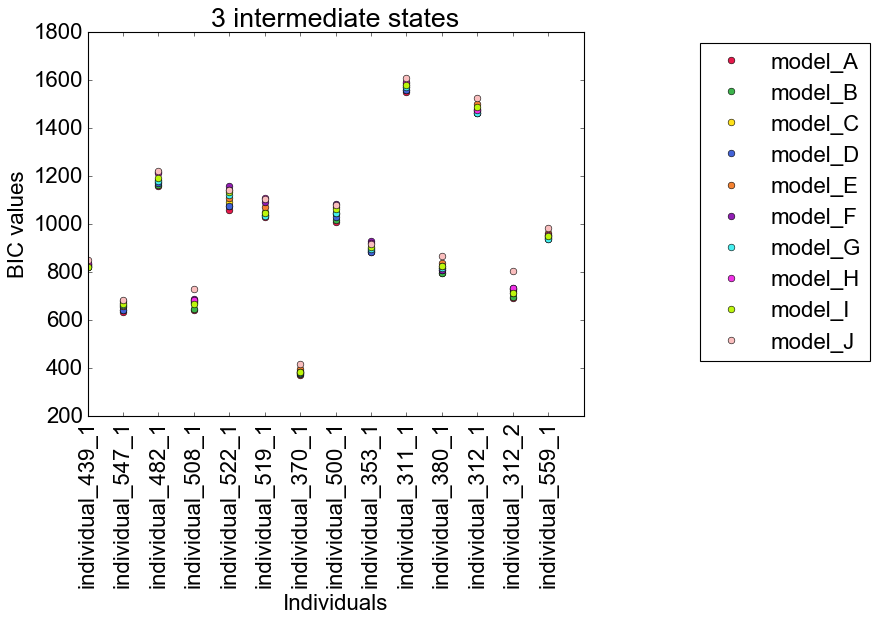

In [15]:
ID_IS=3
plot_scores_vs_individuals_per_model(dir_str,folder_str[0],subsubfolder_str,Scores_BIC,'BIC',colors,ID_IS,N_is,False,opt_save)

In [16]:
Scores_BIC

array([[[ 821.55025018,  632.219417  , 1157.1512884 ,  642.08437239,
         1059.84494177, 1027.09008127,  369.86325203, 1007.97366458,
          881.31450109, 1550.43728744,  794.61022934, 1461.44962227,
          690.33417865,  938.12954144],
        [ 824.32030387,  641.36279507, 1163.90703932,  647.32371035,
         1073.38835659, 1038.92029943,  375.71184856, 1016.12398905,
          888.57259864, 1559.33697502,  794.99232392, 1473.9705574 ,
          697.26848598,  942.97663938],
        [ 827.99992013,  654.75069341, 1174.28187446,  679.39873335,
         1092.03247309, 1049.56000402,  388.69016983, 1041.17794307,
          889.10790538, 1569.9925267 ,  814.85150723, 1479.43475373,
          719.33812045,  952.38594372],
        [ 825.47908044,  641.57468229, 1169.07507141,  672.24425324,
         1075.07236862, 1036.87156243,  382.33147418, 1029.50355284,
          881.84322996, 1559.39394308,  808.39584911, 1468.41939745,
          712.27325043,  949.85230911],
        [ 83

### Table of BIC values

#### all individuals

In [78]:
df_styled_BIC = get_styled_Score_table('compare individuals',N_is,ID_IS,Scores_BIC,[],'BIC',subsubfolder_str,M_names,bool_fit_repetitions_seperately)

In [79]:
df_styled_BIC

,model,439_1,547_1,482_1,508_1,522_1,519_1,370_1,500_1,353_1,311_1,380_1,312_1,312_2,559_1
0,model_A,821.55,632.219,1157.15,642.084,1059.84,1027.09,369.863,1007.97,881.315,1550.44,794.61,1461.45,690.334,938.13
1,model_B,824.32,641.363,1163.91,647.324,1073.39,1038.92,375.712,1016.12,888.573,1559.34,794.992,1473.97,697.268,942.977
2,model_C,828,654.751,1174.28,679.399,1092.03,1049.56,388.69,1041.18,889.108,1569.99,814.852,1479.43,719.338,952.386
3,model_D,825.479,641.575,1169.08,672.244,1075.07,1036.87,382.331,1029.5,881.843,1559.39,808.396,1468.42,712.273,949.852
4,model_E,833.096,659.537,1182.68,682.178,1106.69,1071.8,393.956,1047.03,899.562,1577.75,838.095,1501.14,726.633,960.1
5,model_F,832.396,676.874,1214.37,685.378,1156.01,1092.72,377.348,1083.6,928.842,1587.17,808.283,1462.43,727.32,946.585
6,model_G,818.813,661.337,1179.52,673.315,1119.76,1034.49,378.32,1044.93,897.37,1569.5,816.602,1463.81,731.199,938.516
7,model_H,835.258,669.355,1210.43,681.482,1142.59,1108.26,383.702,1071.83,918.696,1590.49,822.405,1474.06,731.65,954.759
8,model_I,819.626,667.456,1189.63,666.861,1131.31,1047.18,384.304,1062.71,902.904,1579.94,826.415,1486.55,713.418,947.672
9,model_J,850.006,683.126,1221.04,728.154,1142.73,1102.29,415.514,1078.97,917.746,1608.62,867.154,1522.44,805.519,984.409


In [21]:
Scores_BIC_H = Scores_BIC[:,:,0:len(I_names_H)]
Scores_BIC_C = Scores_BIC[:,:,len(I_names_H)+1:len(I_names_H)+len(I_names_C)]
Scores_BIC_MDS = Scores_BIC[:,:,len(I_names_H)+len(I_names_C)+1:np.shape(Scores_BIC)[2]]

#### Healthy individuals

In [81]:
get_styled_Score_table('compare individuals',N_is,ID_IS,Scores_BIC_H,[],'BIC',subsubfolder_str_H,M_names,bool_fit_repetitions_seperately)


,model,439_1,547_1,482_1,508_1,522_1,519_1,370_1,500_1,353_1,311_1,380_1,312_1,312_2,559_1
0,model_A,821.55,632.219,1157.15,642.084,1059.84,1027.09,369.863,1007.97,881.315,1550.44,794.61,1461.45,690.334,938.13
1,model_B,824.32,641.363,1163.91,647.324,1073.39,1038.92,375.712,1016.12,888.573,1559.34,794.992,1473.97,697.268,942.977
2,model_C,828,654.751,1174.28,679.399,1092.03,1049.56,388.69,1041.18,889.108,1569.99,814.852,1479.43,719.338,952.386
3,model_D,825.479,641.575,1169.08,672.244,1075.07,1036.87,382.331,1029.5,881.843,1559.39,808.396,1468.42,712.273,949.852
4,model_E,833.096,659.537,1182.68,682.178,1106.69,1071.8,393.956,1047.03,899.562,1577.75,838.095,1501.14,726.633,960.1
5,model_F,832.396,676.874,1214.37,685.378,1156.01,1092.72,377.348,1083.6,928.842,1587.17,808.283,1462.43,727.32,946.585
6,model_G,818.813,661.337,1179.52,673.315,1119.76,1034.49,378.32,1044.93,897.37,1569.5,816.602,1463.81,731.199,938.516
7,model_H,835.258,669.355,1210.43,681.482,1142.59,1108.26,383.702,1071.83,918.696,1590.49,822.405,1474.06,731.65,954.759
8,model_I,819.626,667.456,1189.63,666.861,1131.31,1047.18,384.304,1062.71,902.904,1579.94,826.415,1486.55,713.418,947.672
9,model_J,850.006,683.126,1221.04,728.154,1142.73,1102.29,415.514,1078.97,917.746,1608.62,867.154,1522.44,805.519,984.409


#### CHIP individuals

In [82]:
get_styled_Score_table('compare individuals',N_is,ID_IS,Scores_BIC_C,[],'BIC',subsubfolder_str_C,M_names,bool_fit_repetitions_seperately)

,model
0,model_A
1,model_B
2,model_C
3,model_D
4,model_E
5,model_F
6,model_G
7,model_H
8,model_I
9,model_J


#### MDS patients

In [83]:
get_styled_Score_table('compare individuals',N_is,ID_IS,Scores_BIC_MDS,[],'BIC',subsubfolder_str_MDS,M_names,bool_fit_repetitions_seperately)

,model
0,model_A
1,model_B
2,model_C
3,model_D
4,model_E
5,model_F
6,model_G
7,model_H
8,model_I
9,model_J


In [84]:
#get_styled_Score_table('compare individuals',N_is,ID_IS,Scores_BIC_MDS,[],'BIC',subsubfolder_str_MDS,M_names,bool_fit_repetitions_seperately)

In [22]:
best_BIC, plausible_BIC, rejected_BIC = calculate_Score_category_percentages(Scores_BIC)
if any([groups[i]=='healthy' for i in range(0,len(groups))]):
    best_BIC_H, plausible_BIC_H, rejected_BIC_H = calculate_Score_category_percentages(Scores_BIC_H)
if any([groups[i]=='CHIP' for i in range(0,len(groups))]):
    best_BIC_C, plausible_BIC_C, rejected_BIC_C = calculate_Score_category_percentages(Scores_BIC_C)
if any([groups[i]=='MDS' for i in range(0,len(groups))]):
    best_BIC_MDS, plausible_BIC_MDS, rejected_BIC_MDS = calculate_Score_category_percentages(Scores_BIC_MDS)

In [23]:
plt = loadPltSettings(18,10) #fonsize, markersize

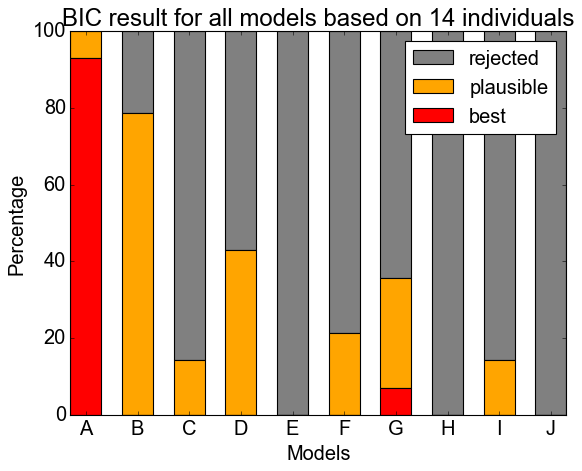

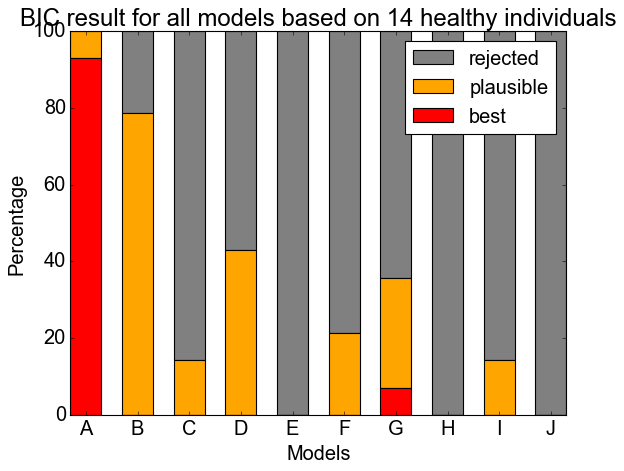

In [24]:
title_str = ' '+str(len(I_names_H)+len(I_names_C)+len(I_names_MDS))+' '
plot_stackedBarplot_of_Score_category_percentages(best_BIC, plausible_BIC, rejected_BIC, 'BIC', dir_str, folder_str[0],title_str,opt_save)
if any([groups[i]=='healthy' for i in range(0,len(groups))]):
    title_str_H = ' '+str(len(I_names_H))+' healthy '
    plot_stackedBarplot_of_Score_category_percentages(best_BIC_H, plausible_BIC_H, rejected_BIC_H, 'BIC', dir_str, folder_str[0],title_str_H,opt_save)
if any([groups[i]=='CHIP' for i in range(0,len(groups))]):
    title_str_C = ' '+str(len(I_names_C))+' CHIP '
    plot_stackedBarplot_of_Score_category_percentages(best_BIC_C, plausible_BIC_C, rejected_BIC_C, 'BIC', dir_str, folder_str[0],title_str_C,opt_save)
if any([groups[i]=='MDS' for i in range(0,len(groups))]):
    title_str_MDS = ' '+str(len(I_names_MDS))+' MDS '
    plot_stackedBarplot_of_Score_category_percentages(best_BIC_MDS, plausible_BIC_MDS, rejected_BIC_MDS, 'BIC', dir_str, folder_str[0],title_str_MDS,opt_save)

### Table of AIC values

#### b) for a certain intermediate state per individual

In [25]:
noise_level_str = ''
[Scores_AIC, Scores_AIC_all] = getScores(dir_str,folder_str,subfolder_str,subsubfolder_str,groups_str,noise_level_str,'AIC',bool_fit_repetitions_seperately)
best_AIC, plausible_AIC, rejected_AIC = calculate_Score_category_percentages(Scores_AIC)

/Users/lisa.bast/Documents/MATLAB_WD/class_1/HematopoiesisAnalysis/AnalysisAndModeling/BulkAnalysis/Lineage_Hierarchy_Comparison/Model_Selection/results_hierarchy_comparison_BIC_7divs_3iS_HO_LogNormal_fit_iC/
ws_scores_groups_healthy_rep_sep.mat


In [26]:
if any([groups[i]=='healthy' for i in range(0,len(groups))]):
    Scores_AIC_H = Scores_AIC[:,:,0:len(I_names_H)]
    best_AIC_H, plausible_AIC_H, rejected_AIC_H = calculate_Score_category_percentages(Scores_AIC_H)
if any([groups[i]=='CHIP' for i in range(0,len(groups))]):
    Scores_AIC_C = Scores_AIC[:,:,len(I_names_H)+1:len(I_names_H)+len(I_names_C)]
    best_AIC_C, plausible_AIC_C, rejected_AIC_C = calculate_Score_category_percentages(Scores_AIC_C)
if any([groups[i]=='MDS' for i in range(0,len(groups))]):
    Scores_AIC_MDS = Scores_AIC[:,:,len(I_names_H)+len(I_names_C)+1:np.shape(Scores_AIC)[2]]
    best_AIC_MDS, plausible_AIC_MDS, rejected_AIC_MDS = calculate_Score_category_percentages(Scores_AIC_MDS)

#### all individuals

In [92]:
get_styled_Score_table('compare individuals',N_is,ID_IS,Scores_AIC,Scores_AIC_all,'AIC',subsubfolder_str,M_names,bool_fit_repetitions_seperately)

,model,439_1,547_1,482_1,508_1,522_1,519_1,370_1,500_1,353_1,311_1,380_1,312_1,312_2,559_1
0,model_A,714.094,540.432,1049.69,544.049,952.388,923.95,286.131,904.833,773.858,1425.65,696.575,1338.9,587.194,830.673
1,model_B,713.026,546.297,1052.61,545.787,962.094,932.096,288.989,909.3,777.278,1430.09,693.456,1347.05,590.445,831.682
2,model_C,712.868,556.407,1059.15,574.361,976.901,939.053,298.977,930.671,773.976,1436.29,709.814,1348.13,608.831,837.254
3,model_D,714.185,546.509,1057.78,570.708,963.778,930.048,295.609,922.68,770.549,1430.15,706.859,1341.49,605.449,838.558
4,model_E,714.126,557.915,1063.71,573.639,987.719,957.606,301.252,932.842,780.592,1439.59,729.556,1365.46,612.442,841.13
5,model_F,721.102,581.809,1103.07,583.841,1044.71,985.897,290.625,976.781,817.548,1457.92,706.746,1335.51,620.496,835.291
6,model_G,711.357,569.549,1072.07,575.28,1012.31,931.345,294.587,941.793,789.913,1444.71,718.566,1341.26,628.059,831.059
7,model_H,720.126,571.011,1095.3,576.444,1027.46,997.757,293.989,961.318,803.564,1456.78,717.367,1342.76,621.143,839.627
8,model_I,708.332,572.391,1078.33,565.324,1020.01,940.356,297.581,955.884,791.61,1450.69,724.878,1359.62,606.594,836.378
9,model_J,719.523,571.671,1090.56,609.111,1012.24,977.05,313.839,953.729,787.264,1457.09,748.111,1373.63,680.278,853.927


#### healthy individuals

In [93]:
get_styled_Score_table('compare individuals',N_is,ID_IS,Scores_AIC_H,Scores_AIC_all,'AIC',subsubfolder_str_H,M_names,bool_fit_repetitions_seperately)

,model,439_1,547_1,482_1,508_1,522_1,519_1,370_1,500_1,353_1,311_1,380_1,312_1,312_2,559_1
0,model_A,714.094,540.432,1049.69,544.049,952.388,923.95,286.131,904.833,773.858,1425.65,696.575,1338.9,587.194,830.673
1,model_B,713.026,546.297,1052.61,545.787,962.094,932.096,288.989,909.3,777.278,1430.09,693.456,1347.05,590.445,831.682
2,model_C,712.868,556.407,1059.15,574.361,976.901,939.053,298.977,930.671,773.976,1436.29,709.814,1348.13,608.831,837.254
3,model_D,714.185,546.509,1057.78,570.708,963.778,930.048,295.609,922.68,770.549,1430.15,706.859,1341.49,605.449,838.558
4,model_E,714.126,557.915,1063.71,573.639,987.719,957.606,301.252,932.842,780.592,1439.59,729.556,1365.46,612.442,841.13
5,model_F,721.102,581.809,1103.07,583.841,1044.71,985.897,290.625,976.781,817.548,1457.92,706.746,1335.51,620.496,835.291
6,model_G,711.357,569.549,1072.07,575.28,1012.31,931.345,294.587,941.793,789.913,1444.71,718.566,1341.26,628.059,831.059
7,model_H,720.126,571.011,1095.3,576.444,1027.46,997.757,293.989,961.318,803.564,1456.78,717.367,1342.76,621.143,839.627
8,model_I,708.332,572.391,1078.33,565.324,1020.01,940.356,297.581,955.884,791.61,1450.69,724.878,1359.62,606.594,836.378
9,model_J,719.523,571.671,1090.56,609.111,1012.24,977.05,313.839,953.729,787.264,1457.09,748.111,1373.63,680.278,853.927


#### CHIP individuals

In [95]:
if any([groups[i]=='CHIP' for i in range(0,len(groups))]):
    get_styled_Score_table('compare individuals',N_is,ID_IS,Scores_AIC_C,Scores_AIC_all,'AIC',subsubfolder_str_C,M_names,bool_fit_repetitions_seperately)

#### MDS individuals

In [96]:
if any([groups[i]=='MDS' for i in range(0,len(groups))]):
    get_styled_Score_table('compare individuals',N_is,ID_IS,Scores_AIC_MDS,Scores_AIC_all,'AIC',subsubfolder_str_MDS,M_names,bool_fit_repetitions_seperately)

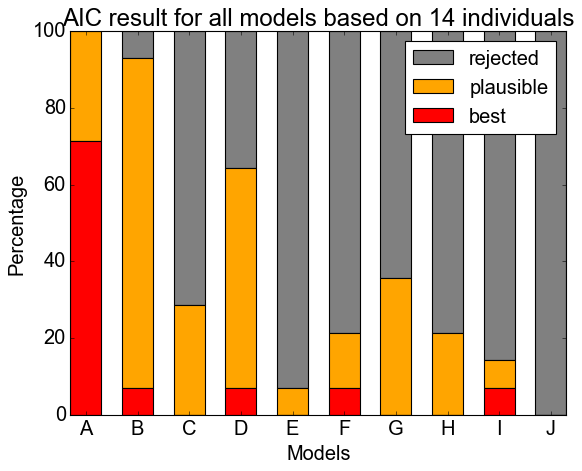

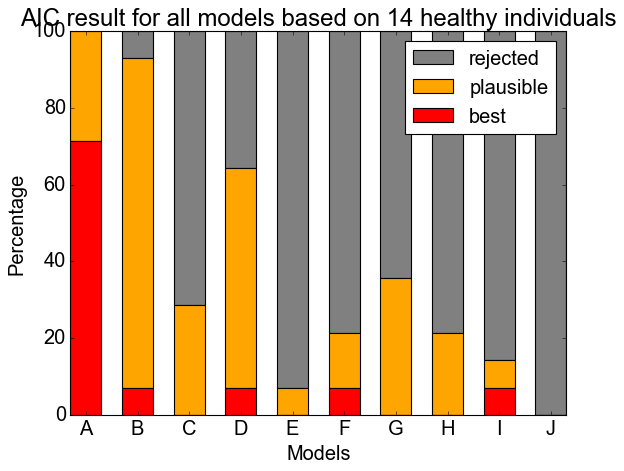

In [27]:
plot_stackedBarplot_of_Score_category_percentages(best_AIC, plausible_AIC, rejected_AIC, 'AIC', dir_str, folder_str[0], title_str, opt_save)
if any([groups[i]=='healthy' for i in range(0,len(groups))]):
    plot_stackedBarplot_of_Score_category_percentages(best_AIC_H, plausible_AIC_H, rejected_AIC_H, 'AIC', dir_str, folder_str[0], title_str_H ,opt_save)
if any([groups[i]=='CHIP' for i in range(0,len(groups))]):
    plot_stackedBarplot_of_Score_category_percentages(best_AIC_C, plausible_AIC_C, rejected_AIC_C, 'AIC', dir_str, folder_str[0], title_str_C,opt_save)
if any([groups[i]=='MDS' for i in range(0,len(groups))]):
    plot_stackedBarplot_of_Score_category_percentages(best_AIC_MDS, plausible_AIC_MDS, rejected_AIC_MDS, 'AIC', dir_str, folder_str[0], title_str_MDS,opt_save)

In [28]:
noise_level_str = ''
[Scores_AIC_c, Scores_AIC_c_all] = getScores(dir_str,folder_str,subfolder_str,subsubfolder_str,groups_str,noise_level_str,'AIC_c',bool_fit_repetitions_seperately)
best_AIC_c, plausible_AIC_c, rejected_AIC_c = calculate_Score_category_percentages(Scores_AIC_c)

/Users/lisa.bast/Documents/MATLAB_WD/class_1/HematopoiesisAnalysis/AnalysisAndModeling/BulkAnalysis/Lineage_Hierarchy_Comparison/Model_Selection/results_hierarchy_comparison_BIC_7divs_3iS_HO_LogNormal_fit_iC/
ws_scores_groups_healthy_rep_sep.mat


In [121]:
if any([groups[i]=='healthy' for i in range(0,len(groups))]):
    Scores_AIC_c_H = Scores_AIC_c[:,:,0:len(I_names_H)]
    best_AIC_c_H, plausible_AIC_c_H, rejected_AIC_c_H = calculate_Score_category_percentages(Scores_AIC_c_H)
if any([groups[i]=='CHIP' for i in range(0,len(groups))]):
    Scores_AIC_c_C = Scores_AIC_c[:,:,len(I_names_H)+1:len(I_names_H)+len(I_names_C)]
    best_AIC_c_C, plausible_AIC_c_C, rejected_AIC_c_C = calculate_Score_category_percentages(Scores_AIC_c_C)
if any([groups[i]=='MDS' for i in range(0,len(groups))]):
    Scores_AIC_c_MDS = Scores_AIC_c[:,:,len(I_names_H)+len(I_names_C)+1:np.shape(Scores_AIC_c)[2]]
    best_AIC_c_MDS, plausible_AIC_c_MDS, rejected_AIC_c_MDS = calculate_Score_category_percentages(Scores_AIC_c_MDS)

#### all individuals

In [122]:
get_styled_Score_table('compare individuals',N_is,ID_IS,Scores_AIC_c,Scores_AIC_c_all,'AIC_c',subsubfolder_str,M_names,bool_fit_repetitions_seperately)

,model,439_1,547_1,482_1,508_1,522_1,519_1,370_1,500_1,353_1,311_1,380_1,312_1,312_2,559_1
0,model_A,721.272,552.169,1056.87,553.577,959.567,932.086,301.911,912.969,781.036,1430.32,706.103,1343.81,595.33,837.851
1,model_B,720.592,558.791,1060.18,555.89,969.66,940.695,305.878,917.899,784.844,1434.96,703.558,1352.17,599.043,839.248
2,model_C,720.836,569.692,1067.12,585.062,984.869,948.132,317.029,939.75,781.944,1441.36,720.515,1353.48,617.911,845.222
3,model_D,721.75,559.003,1065.35,580.81,971.344,938.646,312.498,931.278,778.115,1435.02,716.962,1346.62,614.048,846.124
4,model_E,722.512,572.025,1072.09,584.963,996.104,967.186,320.522,942.423,788.978,1444.88,740.88,1371.03,622.022,849.516
5,model_F,728.667,594.303,1110.64,593.943,1052.28,994.495,307.514,985.379,825.113,1462.79,716.848,1340.63,629.094,842.857
6,model_G,718.535,581.286,1079.25,584.808,1019.49,939.481,310.367,949.928,797.092,1449.38,728.094,1346.17,636.195,838.238
7,model_H,728.094,584.296,1103.27,587.145,1035.43,1006.84,312.04,970.398,811.532,1461.86,728.068,1348.1,630.223,847.595
8,model_I,715.897,584.885,1085.9,575.427,1027.58,948.954,314.47,964.483,799.176,1455.56,734.981,1364.74,615.193,843.944
9,model_J,729.257,588.466,1100.29,622.454,1021.98,988.246,337.107,964.925,796.997,1463.04,761.454,1379.94,691.475,863.66


#### healthy individuals

In [123]:
get_styled_Score_table('compare individuals',N_is,ID_IS,Scores_AIC_c_H,Scores_AIC_c_all,'AIC_c',subsubfolder_str_H,M_names,bool_fit_repetitions_seperately)

,model,439_1,547_1,482_1,508_1,522_1,519_1,370_1,500_1,353_1,311_1,380_1,312_1,312_2,559_1
0,model_A,721.272,552.169,1056.87,553.577,959.567,932.086,301.911,912.969,781.036,1430.32,706.103,1343.81,595.33,837.851
1,model_B,720.592,558.791,1060.18,555.89,969.66,940.695,305.878,917.899,784.844,1434.96,703.558,1352.17,599.043,839.248
2,model_C,720.836,569.692,1067.12,585.062,984.869,948.132,317.029,939.75,781.944,1441.36,720.515,1353.48,617.911,845.222
3,model_D,721.75,559.003,1065.35,580.81,971.344,938.646,312.498,931.278,778.115,1435.02,716.962,1346.62,614.048,846.124
4,model_E,722.512,572.025,1072.09,584.963,996.104,967.186,320.522,942.423,788.978,1444.88,740.88,1371.03,622.022,849.516
5,model_F,728.667,594.303,1110.64,593.943,1052.28,994.495,307.514,985.379,825.113,1462.79,716.848,1340.63,629.094,842.857
6,model_G,718.535,581.286,1079.25,584.808,1019.49,939.481,310.367,949.928,797.092,1449.38,728.094,1346.17,636.195,838.238
7,model_H,728.094,584.296,1103.27,587.145,1035.43,1006.84,312.04,970.398,811.532,1461.86,728.068,1348.1,630.223,847.595
8,model_I,715.897,584.885,1085.9,575.427,1027.58,948.954,314.47,964.483,799.176,1455.56,734.981,1364.74,615.193,843.944
9,model_J,729.257,588.466,1100.29,622.454,1021.98,988.246,337.107,964.925,796.997,1463.04,761.454,1379.94,691.475,863.66


#### CHIP individuals

In [103]:
if any([groups[i]=='CHIP' for i in range(0,len(groups))]):
    get_styled_Score_table('compare individuals',N_is,ID_IS,Scores_AIC_c_C,Scores_AIC_c_all,'AIC_c',subsubfolder_str_C,M_names,bool_fit_repetitions_seperately)

#### MDS individuals

In [104]:
if any([groups[i]=='MDS' for i in range(0,len(groups))]):
    get_styled_Score_table('compare individuals',N_is,ID_IS,Scores_AIC_c_MDS,Scores_AIC_c_all,'AIC_c',subsubfolder_str_MDS,M_names,bool_fit_repetitions_seperately)

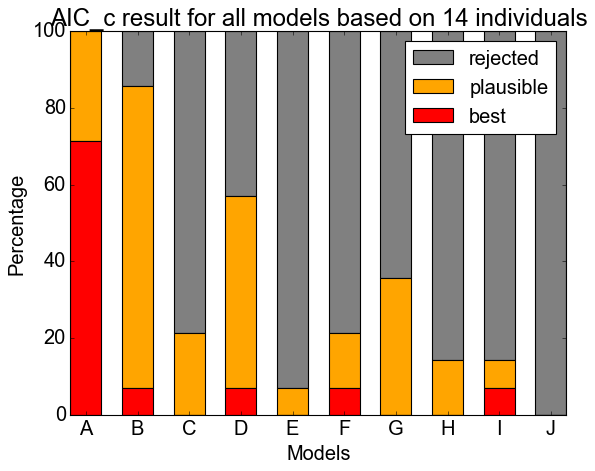

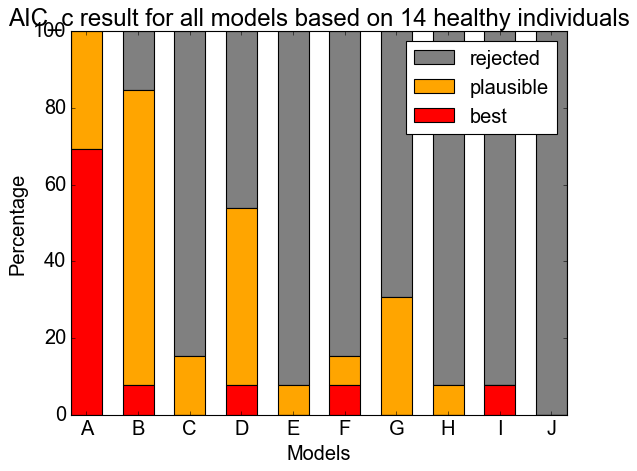

In [30]:
plot_stackedBarplot_of_Score_category_percentages(best_AIC_c, plausible_AIC_c, rejected_AIC_c, 'AIC_c', dir_str, folder_str[0], title_str, opt_save)
if any([groups[i]=='healthy' for i in range(0,len(groups))]):
    plot_stackedBarplot_of_Score_category_percentages(best_AIC_c_H, plausible_AIC_c_H, rejected_AIC_c_H, 'AIC_c', dir_str, folder_str[0], title_str_H ,opt_save)
if any([groups[i]=='CHIP' for i in range(0,len(groups))]):
    plot_stackedBarplot_of_Score_category_percentages(best_AIC_c_C, plausible_AIC_c_C, rejected_AIC_c_C, 'AIC_c', dir_str, folder_str[0], title_str_C,opt_save)
if any([groups[i]=='MDS' for i in range(0,len(groups))]):
    plot_stackedBarplot_of_Score_category_percentages(best_AIC_c_MDS, plausible_AIC_c_MDS, rejected_AIC_c_MDS, 'AIC_c', dir_str, folder_str[0], title_str_MDS,opt_save)

### Model fits

In [176]:
folder_str_new = list()
folder_str_new.append("results_hierarchy_comparison_BIC_7divs_"+str(ID_IS)+"iS_HO_"+noise_type+"_fit_iC/")
plotModelFitToData(dir_str,folder_str_new,subfolder_str,subsubfolder_str,CT,cols_CT,False,opt_save)

#### parameter estimates

In [31]:
last_subsubfolder_str_H = 'individual_'+str(I_names_H[len(I_names_H)-1])
par_transformation = 'log10'
col =  ['#000000']
opt_comparison = 'no comparison'
rot_deg = 90
bool_test_par = False
bool_mean_idPars = False
bool_weightedMean_Pars = False 

In [32]:
last_subsubfolder_str_H

'individual_559_1'

In [119]:
os.chdir(dir_str)
%run 'defined_functions.ipynb'

/Users/lisa.bast/Documents/MATLAB_WD/class_1/HematopoiesisAnalysis/AnalysisAndModeling/BulkAnalysis/Lineage_Hierarchy_Comparison/Model_Selection


/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.to_numpy()' or '.array' instead.
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:26: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.values' or 'np.asarray(..)' instead.
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in greater
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher

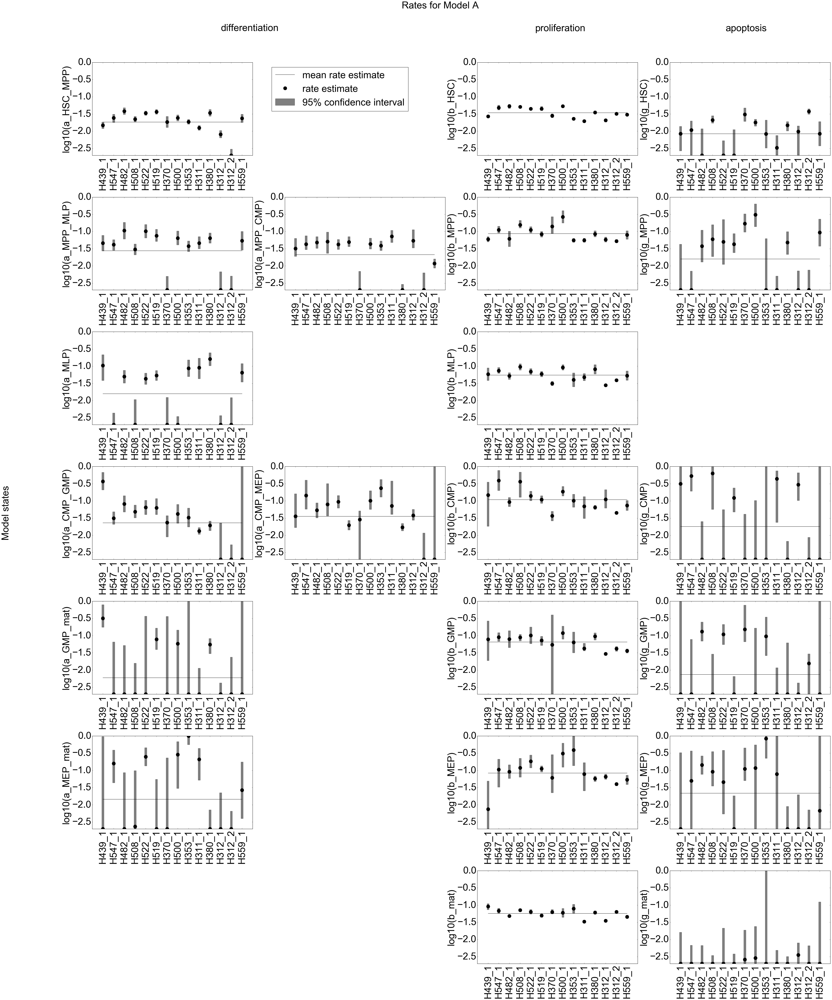

/Users/lisa.bast/Documents/MATLAB_WD/class_1/HematopoiesisAnalysis/AnalysisAndModeling/BulkAnalysis/Lineage_Hierarchy_Comparison/Model_Selection


/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.to_numpy()' or '.array' instead.
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:26: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.values' or 'np.asarray(..)' instead.
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in greater
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher

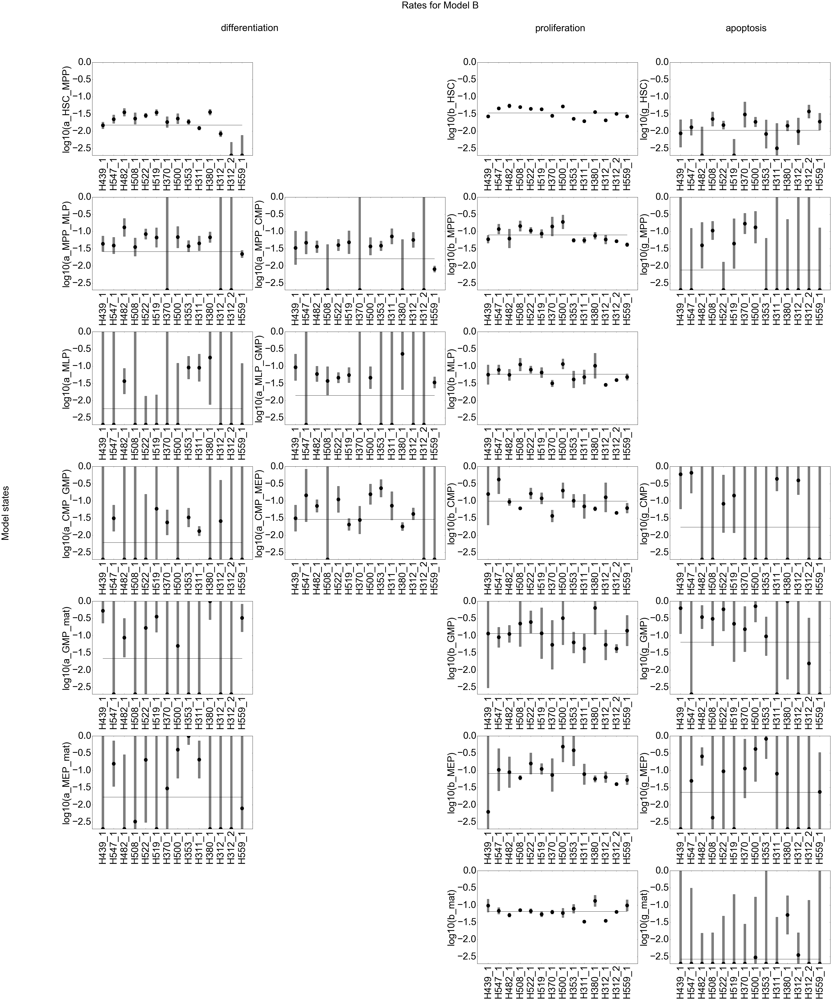

/Users/lisa.bast/Documents/MATLAB_WD/class_1/HematopoiesisAnalysis/AnalysisAndModeling/BulkAnalysis/Lineage_Hierarchy_Comparison/Model_Selection


/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.to_numpy()' or '.array' instead.
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:26: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.values' or 'np.asarray(..)' instead.
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in greater
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher

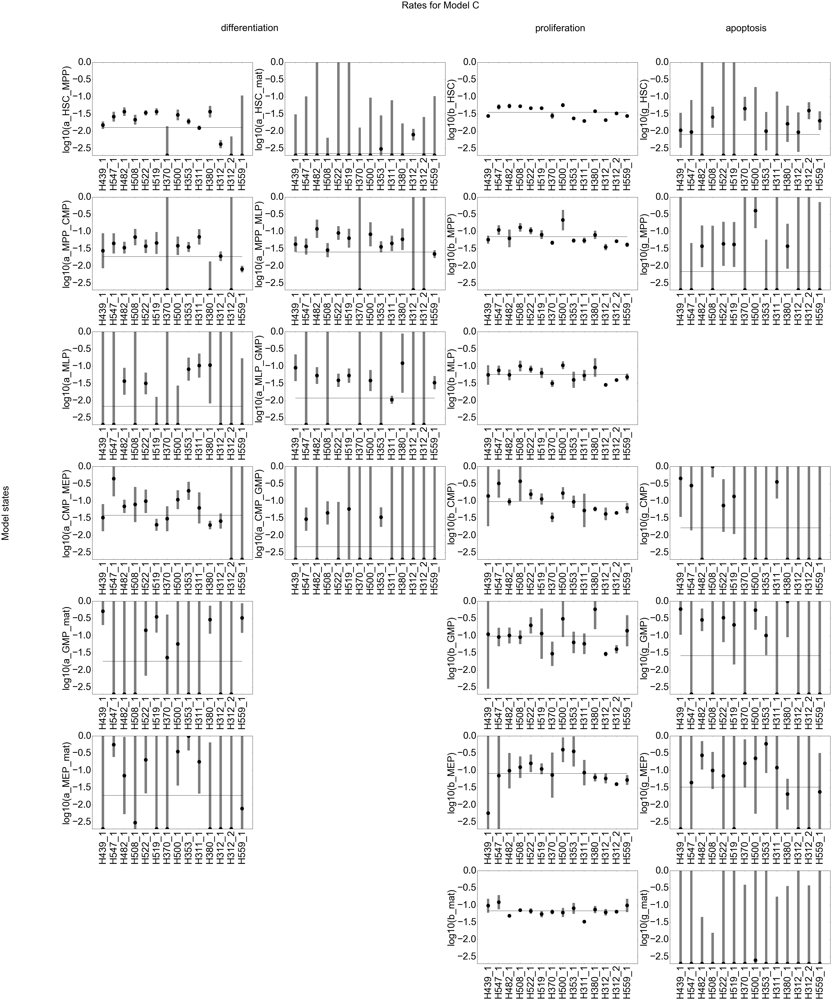

/Users/lisa.bast/Documents/MATLAB_WD/class_1/HematopoiesisAnalysis/AnalysisAndModeling/BulkAnalysis/Lineage_Hierarchy_Comparison/Model_Selection


/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.to_numpy()' or '.array' instead.
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:26: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.values' or 'np.asarray(..)' instead.
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in greater
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher

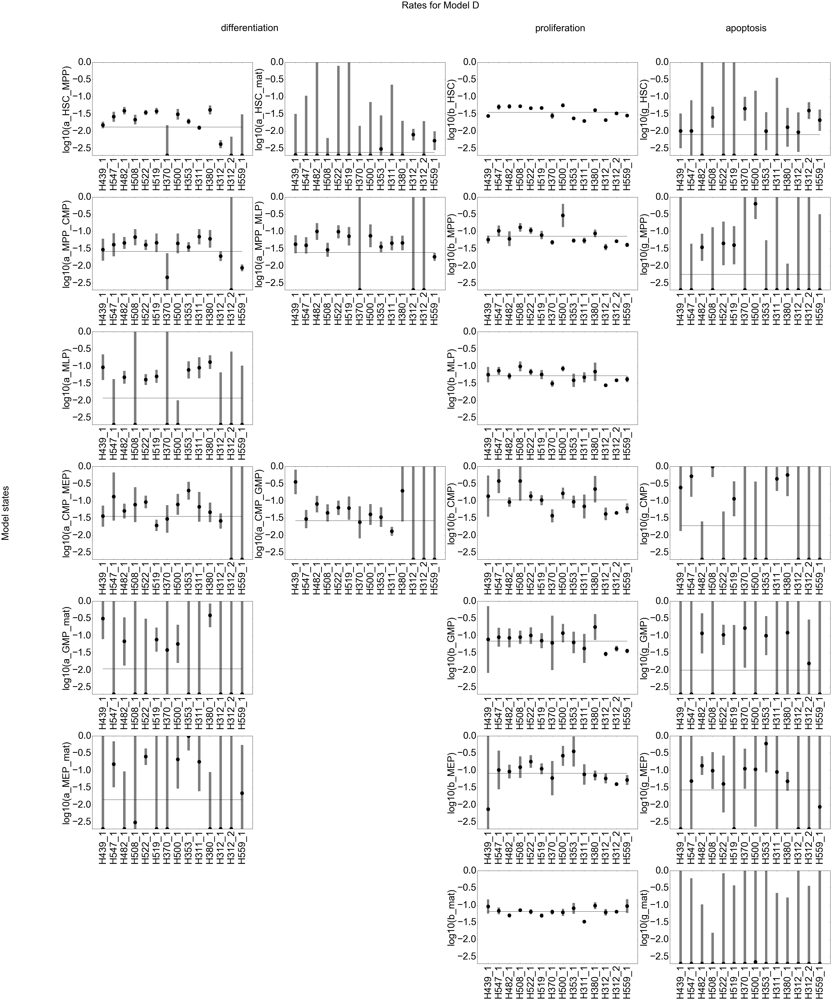

/Users/lisa.bast/Documents/MATLAB_WD/class_1/HematopoiesisAnalysis/AnalysisAndModeling/BulkAnalysis/Lineage_Hierarchy_Comparison/Model_Selection


/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.to_numpy()' or '.array' instead.
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:26: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.values' or 'np.asarray(..)' instead.
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in greater
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher

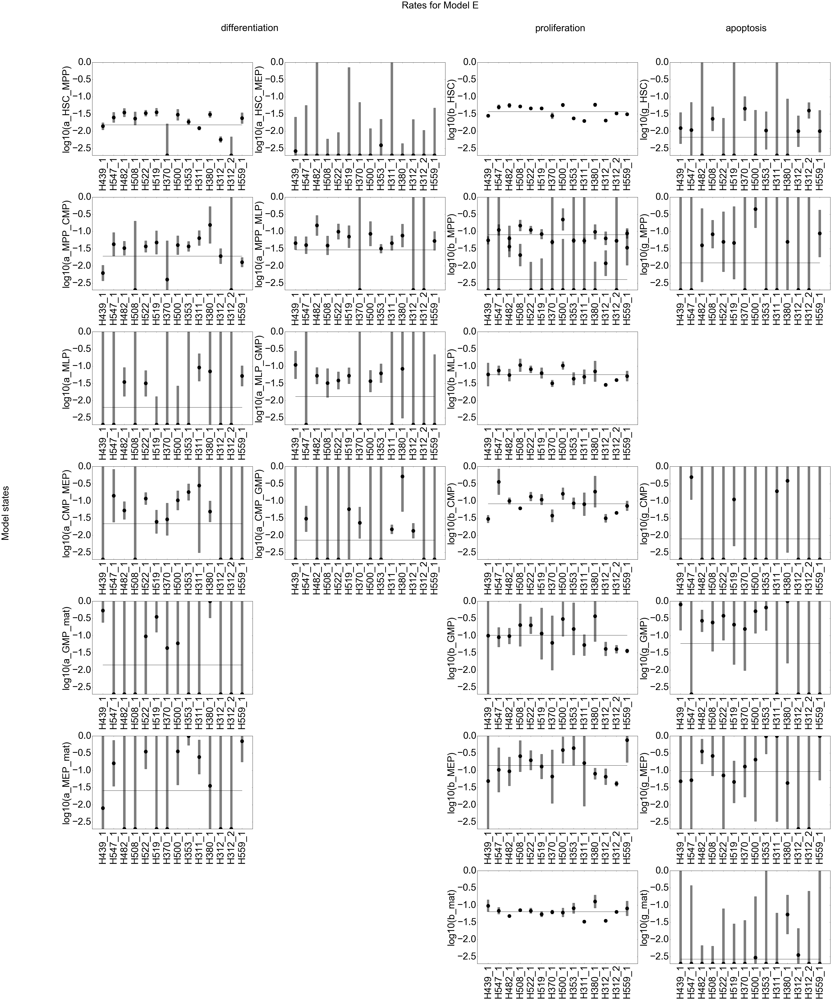

/Users/lisa.bast/Documents/MATLAB_WD/class_1/HematopoiesisAnalysis/AnalysisAndModeling/BulkAnalysis/Lineage_Hierarchy_Comparison/Model_Selection


/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.to_numpy()' or '.array' instead.
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:26: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.values' or 'np.asarray(..)' instead.
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in greater
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher

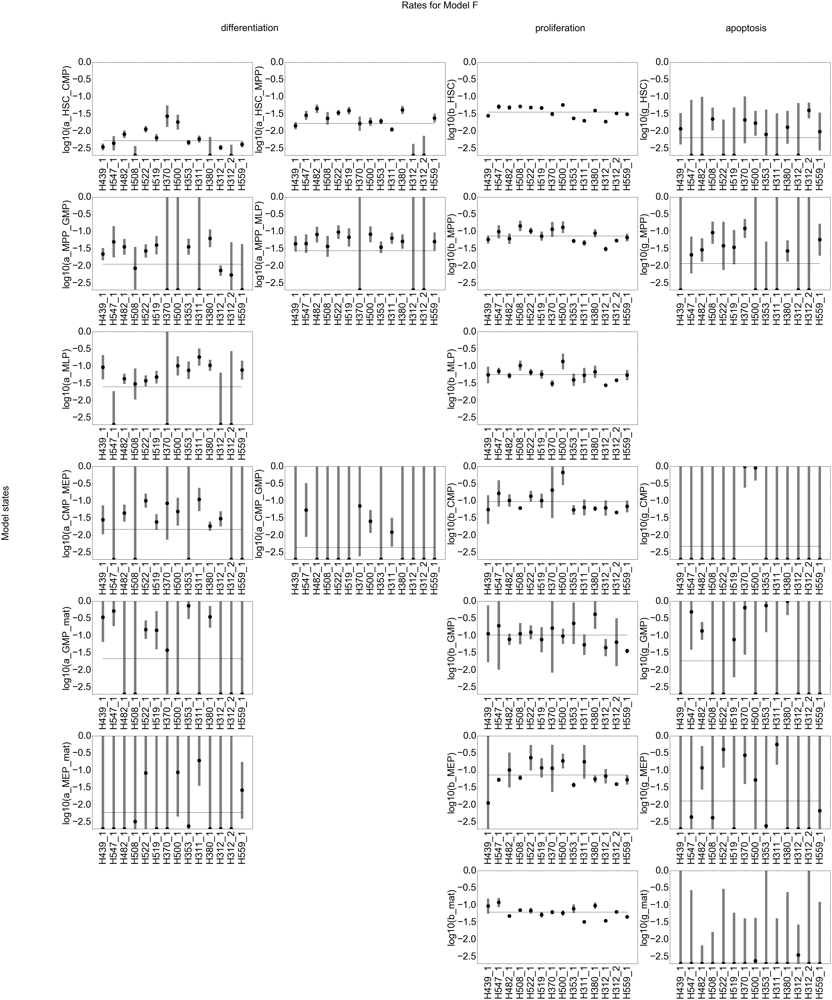

/Users/lisa.bast/Documents/MATLAB_WD/class_1/HematopoiesisAnalysis/AnalysisAndModeling/BulkAnalysis/Lineage_Hierarchy_Comparison/Model_Selection


/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.to_numpy()' or '.array' instead.
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:26: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.values' or 'np.asarray(..)' instead.
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in greater
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher

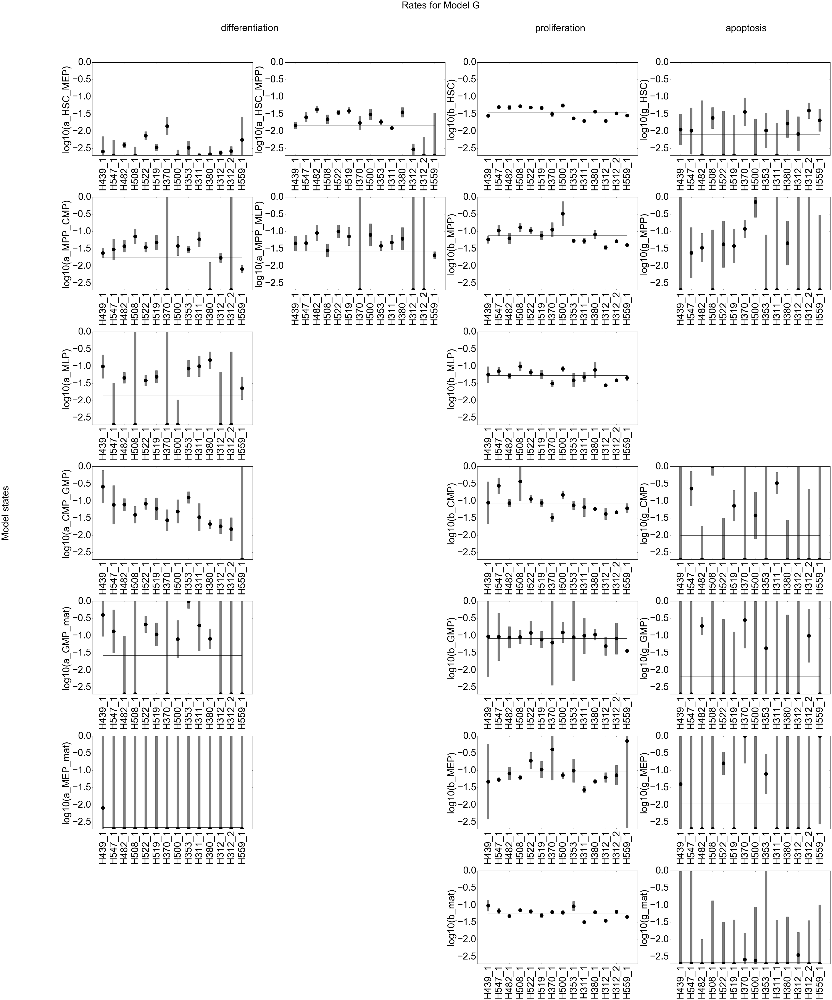

/Users/lisa.bast/Documents/MATLAB_WD/class_1/HematopoiesisAnalysis/AnalysisAndModeling/BulkAnalysis/Lineage_Hierarchy_Comparison/Model_Selection


/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.to_numpy()' or '.array' instead.
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:26: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.values' or 'np.asarray(..)' instead.
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in greater
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher

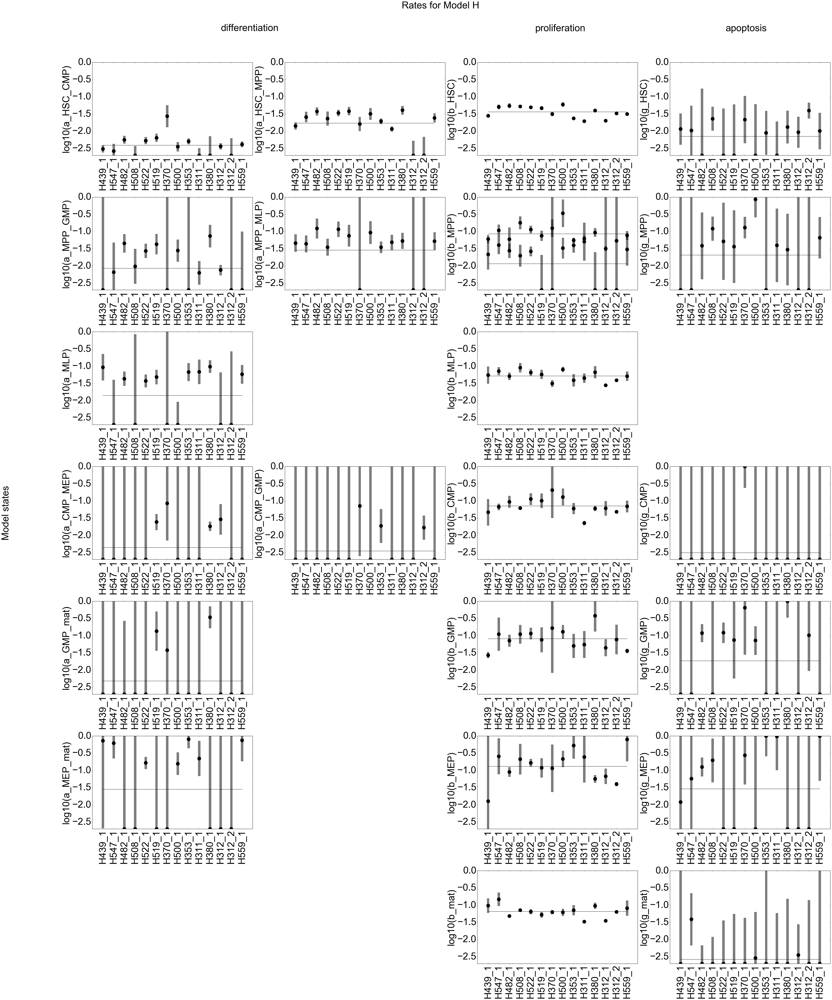

/Users/lisa.bast/Documents/MATLAB_WD/class_1/HematopoiesisAnalysis/AnalysisAndModeling/BulkAnalysis/Lineage_Hierarchy_Comparison/Model_Selection


/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.to_numpy()' or '.array' instead.
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:26: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.values' or 'np.asarray(..)' instead.
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in greater
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher

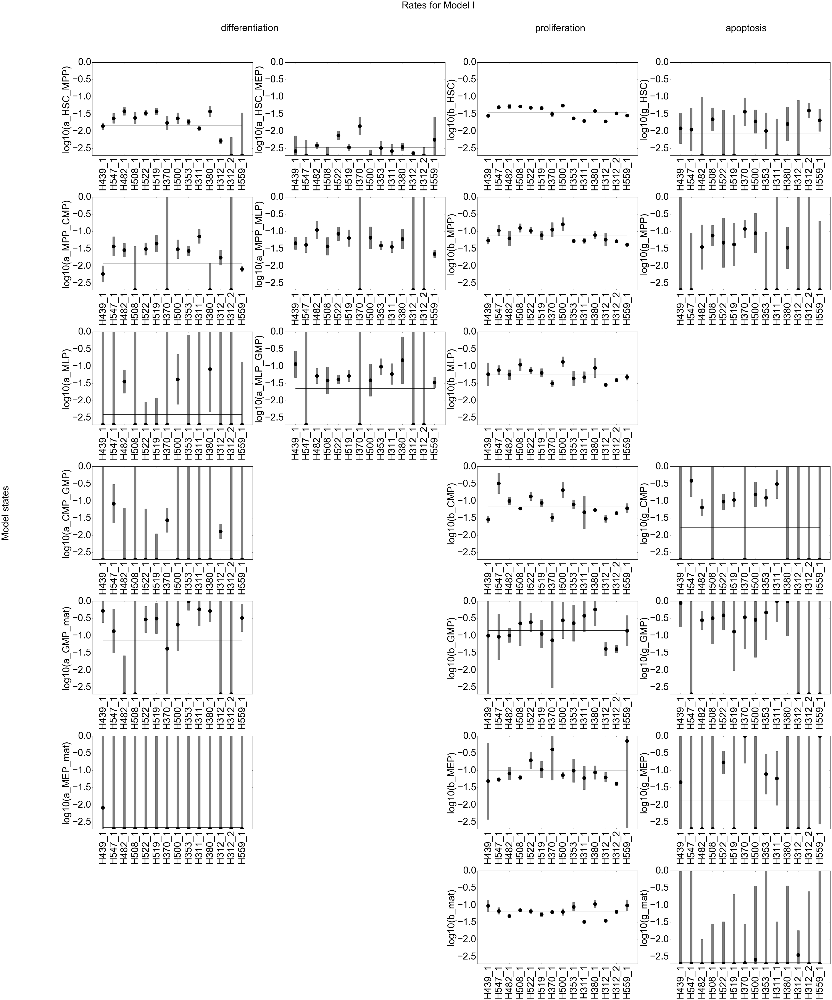

/Users/lisa.bast/Documents/MATLAB_WD/class_1/HematopoiesisAnalysis/AnalysisAndModeling/BulkAnalysis/Lineage_Hierarchy_Comparison/Model_Selection


/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.to_numpy()' or '.array' instead.
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:26: FutureWarning: The 'get_values' method is deprecated and will be removed in a future version. Use '.values' or 'np.asarray(..)' instead.
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in greater
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/lisa.bast/anaconda2/envs/py37/lib/python3.7/site-packages/ipykernel_launcher

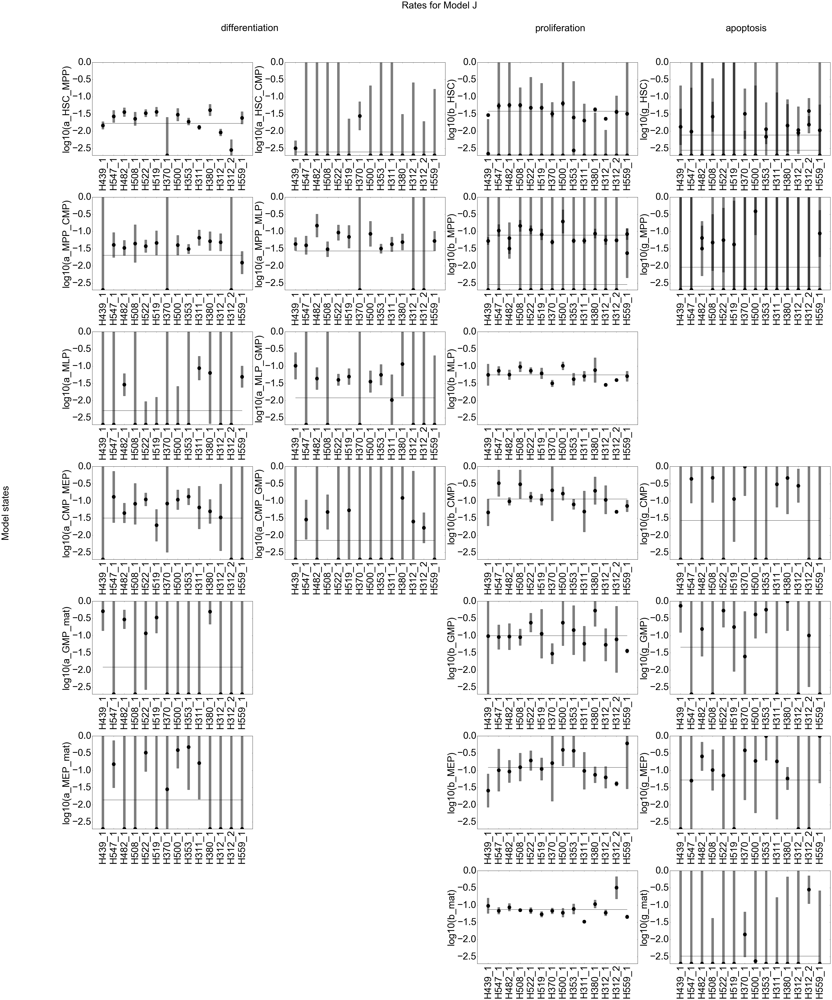

In [120]:
plt = loadPltSettings(40,10) #fonsize, markersize
plot_par_with_CI_vs_individuals(dir_str, folder_str, subfolder_str, subsubfolder_str_H, last_subsubfolder_str_H, [], [], [], M_names, CT, par_transformation, col, opt_comparison, rot_deg, bool_test_par, bool_mean_idPars, bool_weightedMean_Pars, opt_sample_ID, bool_fit_repetitions_seperately,opt_save)
